
## **Projekt - "Wykrywanie obecności graffiti na zdjęciach ulicznych"**

**Autorzy:** Brygida Juszczuk, Edyta Margol


**Wstęp**

Celem projektu było stworzenie modeli klasyfikacji obrazów w celu automatycznego wykrywania obecności graffiti na zdjęciach ulicznych. Zbiór danych pochodzi ze strony https://www.kaggle.com/datasets/pinstripezebra/graffiti-classification i zawiera ponad 20000 obrazów, w tym:
* 799 zdjęć z klasy 'graffiti',
* 19839 zdjęć z klasy 'no_graffiti'.

W ramach eksperymentu zastosowano dwa podejścia do uczenia modeli:

1. Klasyczną konwolucyjną sieć neuronową (CNN) budowaną od podstaw.

2. Transfer learning, czyli wykorzystanie już wytrenowanych modeli głębokiego uczenia (np. ResNet-50, MobileNetV2, EfficientNet-B0) z fine-tuningiem.

Zbiór danych został podzielony na trzy części: 70% danych przeznaczono do uczenia, 15% do walidacji, a 15% do testowania modelu.

Do oceny modeli zostały użyte następujące metryki:

1. **Accuracy (dokładność)** -
określa ogólną skuteczność modelu, czyli odsetek poprawnych klasyfikacji (zarówno pozytywnych, jak i negatywnych) względem wszystkich przypadków. Pokazuje ogólną skuteczność modelu.

2. **Precision (precyzja)** -
mierzy, jaki odsetek przypadków zaklasyfikowanych jako pozytywne faktycznie należy do klasy pozytywnej. Wysoka precyzja oznacza, że model generuje niewiele fałszywych pozytywów (False Positives), czyli nieprawidłowo przypisanych przypadków do klasy pozytywnej.

3. **Recall (czułość)** -
określa, jaki odsetek rzeczywiście pozytywnych przypadków został prawidłowo wykryty przez model. Wysoki recall oznacza, że model rzadko pomija istotne przypadki i skutecznie identyfikuje większość rzeczywistych przykładów klasy pozytywnej (True Positives).

4. **F1-score** -
średnia harmoniczna precision i recall. Dobrze oddaje ogólną jakość klasyfikacji danej klasy, zwłaszcza gdy ważne jest zarówno unikanie pomyłek, jak i przeoczeń.

5. **Macro average (średnia makro)** -
średnia arytmetyczna precision, recall i F1-score dla wszystkich klas – każda klasa ma równą wagę, niezależnie od liczności.

6. **Weighted average (średnia ważona)** -
średnia precision, recall i F1-score z uwzględnieniem liczności klas. Klasy z większą liczbą próbek mają większy wpływ na wynik końcowy.

7. **Confusion Matrix** - stanowi szczegółowe zestawienie poprawnych i błędnych klasyfikacji dla każdej klasy. Umożliwia ocenę liczby:

* True Positives (TP) – poprawnie sklasyfikowanych przypadków klasy pozytywnej,

* True Negatives (TN) – poprawnie sklasyfikowanych przypadków klasy negatywnej,

* False Positives (FP) – błędnych klasyfikacji negatywnych przypadków jako pozytywne,

* False Negatives (FN) – przypadków klasy pozytywnej, które zostały błędnie zaklasyfikowane jako negatywne (niewykryte istotne przypadki).

8. **Krzywa ROC i AUC.**

* ROC (Receiver Operating Characteristic Curve) – krzywa obrazująca zależność między True Positive Rate (recall) a False Positive Rate (1 – specificity) przy różnych progach decyzyjnych modelu. Pokazuje, jak dobrze model rozróżnia klasy w zależności od ustawionego progu.

* AUC (Area Under Curve) – pole pod krzywą ROC. Im bliżej 1, tym lepiej model rozróżnia klasy.

In [ ]:
import os
import shutil
import random
import numpy as np
import pandas as np
import pickle
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display, HTML
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, f1_score
from tensorflow.keras.applications import MobileNetV2, ResNet50, EfficientNetB0
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.losses import BinaryCrossentropy

In [ ]:
#wczytanie pliku kaggle.json (zawierajacego klucz API)
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"edytamargol","key":"5051dff14d5c3ccc98ade49015c93ab9"}'}

In [ ]:
#konfiguracja środowiska
!mkdir -p ~/.kaggle #utworzenie ukrytego katalogu .kaggle w katalogu domowym (~) użytkownika; -p oznacza zapobiega błędowi, jeśli folder już jest
!cp kaggle.json ~/.kaggle/ #kopia pliku kaggle.json do katalogu .kaggle
!chmod 600 ~/.kaggle/kaggle.json #Ustawienie uprawnień pliku kaggle.json tak, by był on dostępny tylko dla właściciela

In [ ]:
#pobranie pliku zip z kaggle
!kaggle datasets download -d pinstripezebra/graffiti-classification #-d to skrót od --dataset

Dataset URL: https://www.kaggle.com/datasets/pinstripezebra/graffiti-classification
License(s): MIT
 98% 1.23G/1.26G [00:15<00:00, 126MB/s]
100% 1.26G/1.26G [00:15<00:00, 85.3MB/s]


In [ ]:
#rozpakowanie
!unzip graffiti-classification.zip -d graffiti_data

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.527654, -122.657006).jpg  
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.527681, -122.674893).jpg  
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.527692, -122.658253).jpg  
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.527694, -122.637563).jpg  
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.527787, -122.673738).jpg  
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.5278, -122.627726).jpg  
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.528, -122.648936).jpg  
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.528075, -122.64716).jpg  
  inflating: graffiti_data/graffiti_streetview/no_graffiti/Portland_ (45.528124, -122.630724).jpg  
  inflating: graffiti_data/graffiti_stree

In [ ]:
# Utworzenie katalogów wyjściowych
!mkdir -p data_all/graffiti
!mkdir -p data_all/no_graffiti

# Skopiowanie danych graffiti
!cp graffiti_data/graffiti_streetview/graffiti/* data_all/graffiti/
!cp graffiti_data/graffiti_streetview/graffiti_train/* data_all/graffiti/

# Skopiowanie danych no_graffiti
!cp graffiti_data/graffiti_streetview/no_graffiti/* data_all/no_graffiti/

In [ ]:
#usuniecie uszkodzonych plików
def find_and_remove_corrupt_images(directory):
    removed = 0
    for subdir, _, files in os.walk(directory):
        for file in files:
            filepath = os.path.join(subdir, file)
            try:
                with Image.open(filepath) as img:
                    img.convert('RGB')  # próbna konwersja
            except Exception as e:
                print(f"Usuwam uszkodzony plik: {filepath} ({str(e)})")
                os.remove(filepath)
                removed += 1
    print(f"Usunięto {removed} uszkodzonych plików z: {directory}")

find_and_remove_corrupt_images('data_all/graffiti')
find_and_remove_corrupt_images('data_all/no_graffiti')

Usunięto 0 uszkodzonych plików z: data_all/graffiti
Usuwam uszkodzony plik: data_all/no_graffiti/Philadelphiae_ (40.001831, -75.113595).jpg (cannot identify image file 'data_all/no_graffiti/Philadelphiae_ (40.001831, -75.113595).jpg')
Usunięto 1 uszkodzonych plików z: data_all/no_graffiti


In [ ]:
#powtarzalność wyników
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# wymuszenie deterministycznych operacji (dla CPU i GPU)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

In [ ]:
def split_data(source_dir, output_base, val_size=0.15, test_size=0.15):
    classes = os.listdir(source_dir)

    for cls in classes:
        images = os.listdir(os.path.join(source_dir, cls))
        train_val, test = train_test_split(images, test_size=test_size, random_state=42)
        train, val = train_test_split(train_val, test_size=val_size / (1 - test_size), random_state=42)

        for subset, name in zip([train, val, test], ['train', 'val', 'test']):
            out_dir = os.path.join(output_base, name, cls)
            os.makedirs(out_dir, exist_ok=True)
            for img in subset:
                src = os.path.join(source_dir, cls, img)
                dst = os.path.join(out_dir, img)
                shutil.copy(src, dst)

split_data('data_all', 'data_split')

In [ ]:
# Wspólne parametry
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

# Augmentacja tylko dla zbioru treningowego
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    brightness_range=(0.8, 1.2)
)

# Walidacja i test: tylko skalowanie
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Generatory
train_generator = train_datagen.flow_from_directory(
    'data_split/train',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    seed=SEED
)

val_generator = val_test_datagen.flow_from_directory(
    'data_split/val',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    seed=SEED
)

test_generator = val_test_datagen.flow_from_directory(
    'data_split/test',
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

Found 14445 images belonging to 2 classes.
Found 3096 images belonging to 2 classes.
Found 3096 images belonging to 2 classes.


# Budowa modelu Custom CNN

In [ ]:
# # Architektura CNN
# model_cnn = Sequential([
#     Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
#     BatchNormalization(),
#     MaxPooling2D(2, 2),

#     Conv2D(64, (3, 3), activation='relu'),
#     BatchNormalization(),
#     MaxPooling2D(2, 2),

#     Conv2D(128, (3, 3), activation='relu'),
#     BatchNormalization(),
#     MaxPooling2D(2, 2),

#     Flatten(),
#     Dense(128, activation='relu'),
#     Dropout(0.5),
#     Dense(2, activation='softmax')
# ])

# # Kompilacja modelu
# model_cnn.compile(
#     optimizer=Adam(learning_rate=0.0001),
#     loss='categorical_crossentropy',
#     metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
# )

# # Trening
# history_cnn = model_cnn.fit(
#     train_generator,
#     epochs=10,
#     validation_data=val_generator,
#     callbacks=[
#         tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#     ]
# )

Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 282s 616ms/step - accuracy: 0.9579 - loss: 0.3298 - precision_1: 0.9579 - recall_1: 0.9579 - val_accuracy: 0.9706 - val_loss: 0.2026 - val_precision_1: 0.9706 - val_recall_1: 0.9706
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 315s 600ms/step - accuracy: 0.9769 - loss: 0.1102 - precision_1: 0.9769 - recall_1: 0.9769 - val_accuracy: 0.9645 - val_loss: 0.1006 - val_precision_1: 0.9645 - val_recall_1: 0.9645
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 271s 600ms/step - accuracy: 0.9784 - loss: 0.0927 - precision_1: 0.9784 - recall_1: 0.9784 - val_accuracy: 0.9700 - val_loss: 0.0986 - val_precision_1: 0.9700 - val_recall_1: 0.9700
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 274s 607ms/step - accuracy: 0.9792 - loss: 0.0881 - precision_1: 0.9792 - recall_1: 0.9792 - val_accuracy: 0.9528 - val_loss: 0.1426 - val_precision_1: 0.9528 - val_recall_1: 0.9528
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 320s 603ms/step - accuracy: 0.9827 - loss: 0.0852 - precision_1: 0.9827 

In [ ]:
#zapisanie wytrenowanego modelu
#model_cnn.save('model_graffiti.h5')

In [ ]:
#zapisanie historii przebiegu
# with open("history_cnn.pkl", "wb") as f:
#     pickle.dump(history_cnn.history, f)

In [ ]:
#załadowanie modelu
model_cnn = load_model('model_graffiti.h5')

In [ ]:
#załadowanie historii przebiegu
with open("history_cnn.pkl", "rb") as f:
    history_cnn = pickle.load(f)

In [ ]:
#funkcja do ewaluacji metryk, macierzy pomyłek i krzywej ROC
def evaluate_model(model, name, generator=test_generator):
    y_prob = model.predict(generator)
    y_pred = np.argmax(y_prob, axis=1)
    y_true = generator.classes
    class_labels = list(generator.class_indices.keys())

    print(f" [Model: {name}] – Classification Report:")
    print(classification_report(y_true, y_pred, target_names=class_labels))
    print(f"F1-score: {f1_score(y_true, y_pred):.4f}")

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
    plt.title(f"Confusion Matrix – {name}")
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.show()

    # ROC i AUC
    y_true_bin = tf.keras.utils.to_categorical(y_true, num_classes=2)
    auc = roc_auc_score(y_true_bin, y_prob)
    print(f"AUC: {auc:.4f}")

    fpr, tpr, _ = roc_curve(y_true_bin[:, 1], y_prob[:, 1])
    plt.figure()
    plt.plot(fpr, tpr, label=f"{name} (AUC = {auc:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"ROC Curve – {name}")
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
#funkcja do pokazania błędnie sklasyfikowanych przypadków
def show_misclassified_images(model, generator, class_labels, num_images=9):
    y_prob = model.predict(generator)
    y_pred = np.argmax(y_prob, axis=1)
    y_true = generator.classes
    file_paths = generator.filepaths

    misclassified_idx = np.where(y_pred != y_true)[0]
    print(f"Liczba błędnie sklasyfikowanych obrazów: {len(misclassified_idx)}")

    plt.figure(figsize=(12, 12))
    for i, idx in enumerate(misclassified_idx[:num_images]):
        img = plt.imread(file_paths[idx])
        plt.subplot(3, 3, i+1)
        plt.imshow(img)
        true_label = class_labels[y_true[idx]]
        pred_label = class_labels[y_pred[idx]]
        plt.title(f"Prawidłowo: {true_label} | Pred: {pred_label}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
#wizualizacja historii przebiegu treningu
def plot_learning_curves(history, name="Model"):
    acc = history.get('accuracy')
    val_acc = history.get('val_accuracy')
    loss = history.get('loss')
    val_loss = history.get('val_loss')

    # Sprawdzenie, czy wszystkie wymagane metryki znajdują się w słowniku history
    if acc is None or val_acc is None or loss is None or val_loss is None:
      print(f"Ostrzeżenie: Brakuje wymaganych metryk (accuracy, val_accuracy, loss, val_loss) w historii dla modelu {name}")

    # Próba użycia alternatywnych nazw metryk, które mogą występować w innych wersjach Keras lub przy różnych konfiguracjach treningu
    acc = history.get('acc', acc)
    val_acc = history.get('val_acc', val_acc)
    loss = history.get('loss', loss)
    val_loss = history.get('val_loss', val_loss)

    # Jeśli po próbie zamiany nadal brakuje metryk, wyświetlenie komunikatu o błędzie i przerwanie działania funkcji
    if acc is None or val_acc is None or loss is None or val_loss is None:
        print(f"Błąd: Nie można znaleźć niezbędnych metryk uczenia dla modelu {name}.")
        return


    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Train Accuracy')
    plt.plot(epochs, val_acc, label='Val Accuracy')
    plt.title(f'{name} – Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Train Loss')
    plt.plot(epochs, val_loss, label='Val Loss')
    plt.title(f'{name} – Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

97/97 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step
 [Model: Model CNN] – Classification Report:
              precision    recall  f1-score   support

    graffiti       0.91      0.74      0.82       120
 no_graffiti       0.99      1.00      0.99      2976

    accuracy                           0.99      3096
   macro avg       0.95      0.87      0.90      3096
weighted avg       0.99      0.99      0.99      3096

F1-score: 0.9933


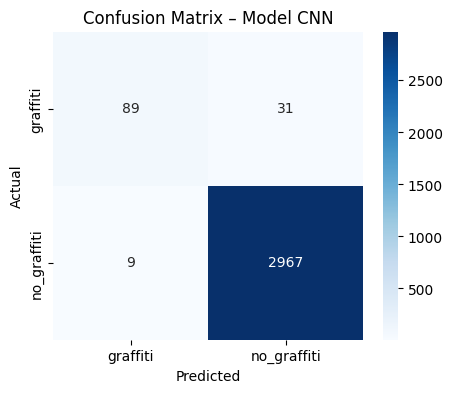

AUC: 0.9467


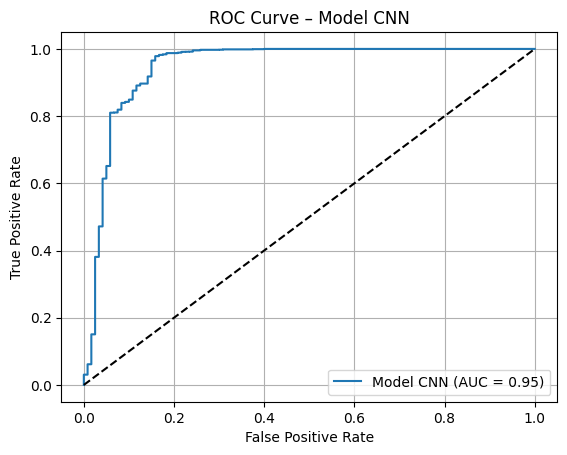

In [ ]:
evaluate_model(model_cnn, "Model CNN")

 # **Interpretacja wyników:**

**1. Ogólna skuteczność modelu**
*  **Accuracy: 0.99** -
Model poprawnie sklasyfikował 99% wszystkich przykładów. To oznacza bardzo wysoką ogólną skuteczność.
*  **F1-score: 0.99**
Model bardzo dobrze równoważy precyzję i czułość, zwłaszcza że większość danych należy do klasy "no_graffiti".

**2. Wyniki dla poszczególnych klas**

**Klasa: graffiti**

* **Precision: 0.91** Spośród wszystkich przypadków zaklasyfikowanych jako "graffiti", 91% to faktycznie graffiti.


* **Recall: 0.74**
Model wykrywa tylko 74% przypadków rzeczywistego graffiti, co oznacza, że wiele przykładów zostaje pominiętych.

* **F1-score: 0.82**
Model stosunkowo dobrze radzi sobie z tą klasą, ale niska czułość obniża ogólną jakość rozpoznawania graffiti.

**Klasa: no_graffiti**

* **Precision: 0.99**
Praktycznie każde wykrycie braku graffiti jest poprawne. Model bardzo rzadko myli się w tej klasie.

* **Recall: 1.00**
Model wykrywa wszystkie przypadki braku graffiti – nie pomija żadnego przykładu tej klasy.

* **F1-score: 0.99**
Doskonała skuteczność klasyfikacji – model niemal idealnie klasyfikuje przypadki, które nie są graffiti.

**3. Średnie wartości:**

* **Macro avg - Precision: 0.95** Średnia precyzja dla obu klas wynosi 95% (czyli średnio 95% przypadków pozytywnie sklasyfikowanych przez model było poprawnych).

* **Macro avg – Recall: 0.87**
Średnia czułość dla obu klas pokazuje, że jedna z klas (graffiti) jest rozpoznawana słabiej.

* **Macro avg – F1-score: 0.90**
Model dobrze rozpoznaje obie klasy, choć występuje pewna nierównowaga – graffiti wypada słabiej.

* **Weighted avg - Precision: 0.99** Model radzi sobie bardzo dobrze z dominującą klasą („no_graffiti”).

* **Weighted avg - Recall: 0.99** Model wykrył 99% wszystkich przykładów, niezależnie od klasy – czyli prawie wszystkie przypadki „graffiti” i „no_graffiti” zostały prawidłowo rozpoznane.

* **Weighted avg – F1-score: 0.99**
Ogólny wynik klasyfikacji jest znakomity, ale duży wpływ na niego ma dominująca klasa "no_graffiti".

**4. Confusion Matrix:**

* True Positives (TP) – 83 zdjęcia z graffiti zostały poprawnie rozpoznane jako "graffiti".

* False Negatives (FN) – 37 zdjęć z graffiti zostało błędnie zaklasyfikowanych jako "no_graffiti" – czyli model przeoczył graffiti.

* True Negatives (TN) – 2974 zdjęcia bez graffiti zostały poprawnie zaklasyfikowane jako "no_graffiti".

* False Positives (FP) – 2 zdjęcia bez graffiti zostały błędnie oznaczone jako "graffiti" – czyli model fałszywie wykrył graffiti.

Model bardzo dobrze rozpoznaje brak graffiti – tylko 2 pomyłki na prawie 3000 przypadków, nieco gorzej zaś radzi sobie z wykrywaniem graffiti – aż 37 przypadków zostało pominiętych.

**5. Krzywa ROC i AUC**

**Krzywa ROC** wznosi się bardzo stromo w górę i znajduje się blisko lewego górnego rogu wykresu, co oznacza że większość punktów na krzywej znajduje się przy niskim FPR (False Positive Rate) oraz wysokim TPR (True Positive Rate). Potwierdza to, że model rzadko się myli i bardzo dobrze odróżnia klasę graffiti od no_graffiti.

**AUC (Area Under Curve)**
Pole pod krzywą wynosi 0.96, co oznacza bardzo wysoką skuteczność klasyfikatora.

97/97 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step
🧩 Liczba błędnie sklasyfikowanych obrazów: 39


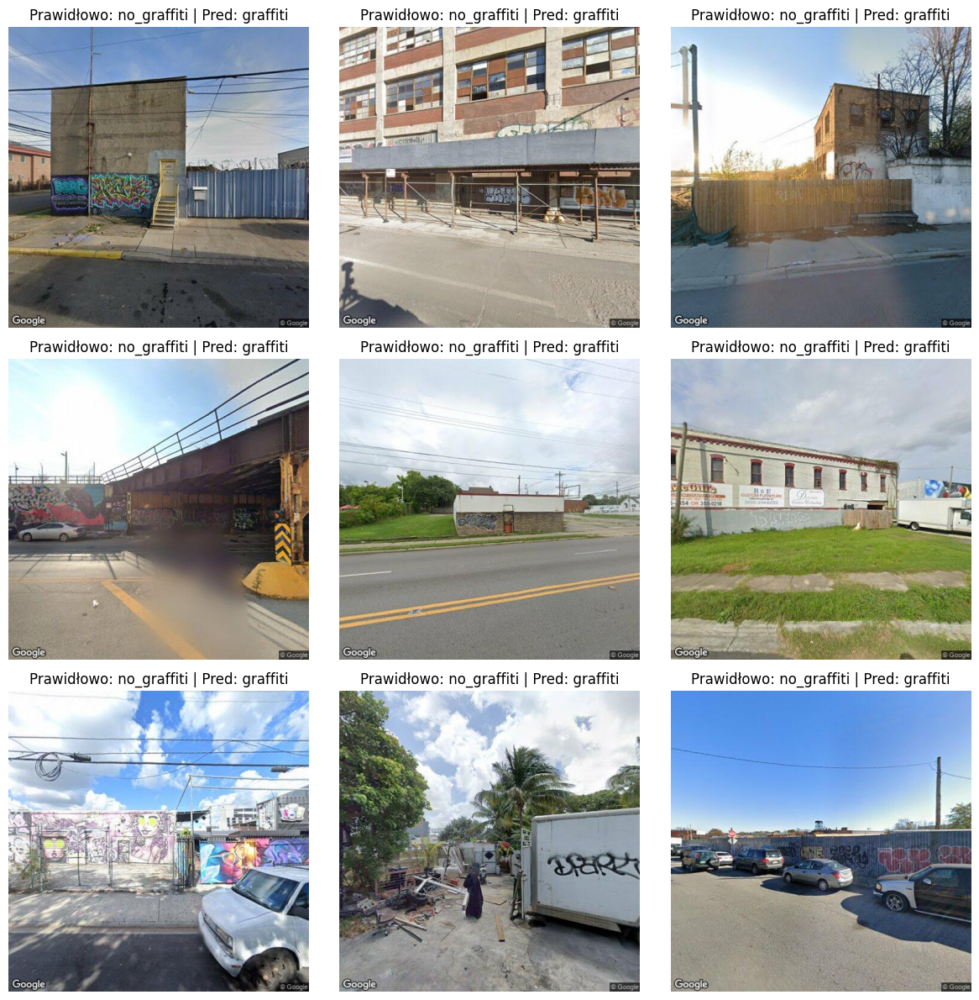

In [ ]:
show_misclassified_images(model_cnn, test_generator, ['no_graffiti', 'graffiti'])

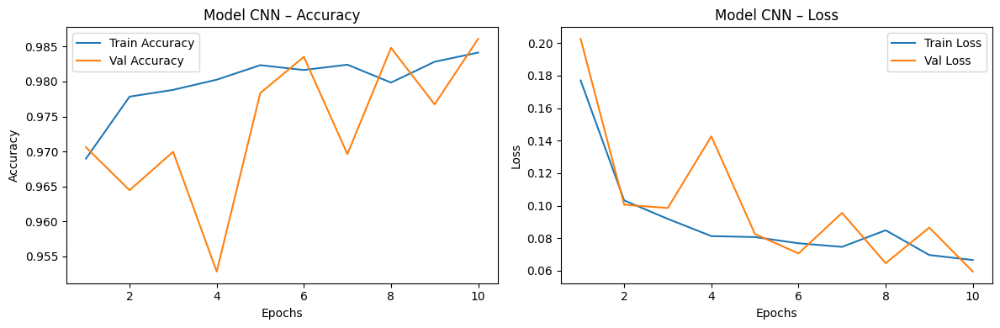

In [ ]:
plot_learning_curves(history_cnn, "Model CNN")

**Dokładność (Accuracy)**

Na wykresie dokładności widać, że model systematycznie poprawia swoje wyniki na zbiorze treningowym. Dokładność rośnie z każdą epoką, osiągając na końcu wartość przekraczającą 98,5%. Jest to bardzo dobry wynik, świadczący o tym, że model skutecznie uczy się rozpoznawać wzorce zawarte w danych treningowych.

Dokładność na zbiorze walidacyjnym również oscyluje wokół wysokich wartości (między 95% a 98,5%), jednak jej przebieg jest znacznie bardziej niestabilny. Widać wyraźne wahania z epoki na epokę. Taka niestabilność może sugerować, że model w pewnym stopniu dopasowuje się do danych treningowych bardziej niż do ogólnych zależności — może to być oznaka delikatnego przeuczenia (overfittingu), chociaż różnice nie są dramatyczne.

**Strata (Loss)**

W przypadku funkcji straty widzimy wyraźnie malejący trend zarówno dla zbioru treningowego, jak i walidacyjnego. Strata treningowa zmniejsza się w sposób stosunkowo płynny, co potwierdza, że model poprawnie minimalizuje błąd w trakcie treningu.

Strata na danych walidacyjnych również ogólnie spada, jednak jej przebieg jest bardziej zmienny, podobnie jak w przypadku dokładności. Mimo tego, różnice między stratą treningową a walidacyjną pod koniec treningu są niewielkie, co świadczy o tym, że model nie przeuczył się w dużym stopniu.



# Transfer learning - MobileNetV2

In [ ]:
# # Załaduj bazowy model bez topu
# base_model = MobileNetV2(input_shape=(224, 224, 3),
#                          include_top=False,
#                          weights='imagenet')

# # Zamrożenie wszystkich warstw modelu bazowego
# base_model.trainable = False

# # Dodanie własnych warstw
# x = base_model.output
# x = GlobalAveragePooling2D()(x)
# x = Dropout(0.5)(x)
# x = Dense(128, activation='relu')(x)
# x = Dropout(0.3)(x)
# predictions = Dense(2, activation='softmax')(x)  # 2 klasy

# # Budowa modelu końcowego
# model_mobilenet = Model(inputs=base_model.input, outputs=predictions)

# # Kompilacja modelu – wstępny trening (bez fine-tuningu)
# model_mobilenet.compile(optimizer=Adam(learning_rate=1e-4),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# # Trening wstępny (z zamrożonymi warstwami)
# history_mobilenet = model_mobilenet.fit(
#     train_generator,
#     validation_data=val_generator,
#     epochs=10,
#     callbacks=[
#         EarlyStopping(patience=3, restore_best_weights=True),
#         ModelCheckpoint('mobilenet_initial.h5', save_best_only=True)
#     ]
# )

# # Odmrożenie części warstw bazowego modelu
# base_model.trainable = True
# for layer in base_model.layers[:-30]: ## Odmrażamy ostatnie ~30 warstw
#     layer.trainable = False

# # Kompilacja z niższym LR
# model_mobilenet.compile(optimizer=Adam(learning_rate=1e-5),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# # Trening fine-tuning
# history_mobilenet_finetune = model_mobilenet.fit(
#     train_generator,
#     validation_data=val_generator,
#     epochs=10,
#     callbacks=[
#         EarlyStopping(patience=3, restore_best_weights=True),
#         ModelCheckpoint('mobilenet_finetuned.h5', save_best_only=True)
#     ]
# )

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
400/452 ━━━━━━━━━━━━━━━━━━━━ 27s 525ms/step - accuracy: 0.8740 - loss: 0.3793

In [ ]:
#załadowanie modelu
model_mobilenet = load_model('mobilenet_initial.h5')
model_mobilenet_fine=load_model('mobilenet_finetuned.h5')

In [ ]:
# #zapisanie historii przebiegu

# # Po treningu wstępnym
# with open("history_mobilenet.pkl", "wb") as f:
#     pickle.dump(history_mobilenet.history, f)

# # Po fine-tuningu
# with open("history_mobilenet_finetune.pkl", "wb") as f:
#     pickle.dump(history_mobilenet_finetune.history, f)

In [ ]:
#Wczytanie historii przebiegu
with open("history_mobilenet.pkl", "rb") as f:
    history_mobilenet = pickle.load(f)

with open("history_mobilenet_finetune.pkl", "rb") as f:
    history_mobilenet_finetuned = pickle.load(f)

97/97 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step
📄 [Model: MobileNetV2] – Classification Report:
              precision    recall  f1-score   support

    graffiti       0.97      0.73      0.83       120
 no_graffiti       0.99      1.00      0.99      2976

    accuracy                           0.99      3096
   macro avg       0.98      0.87      0.91      3096
weighted avg       0.99      0.99      0.99      3096

F1-score: 0.9941


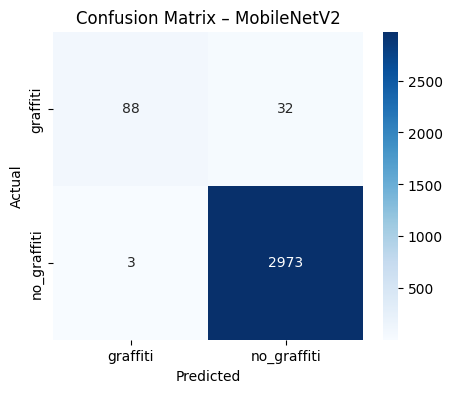

AUC: 0.9805


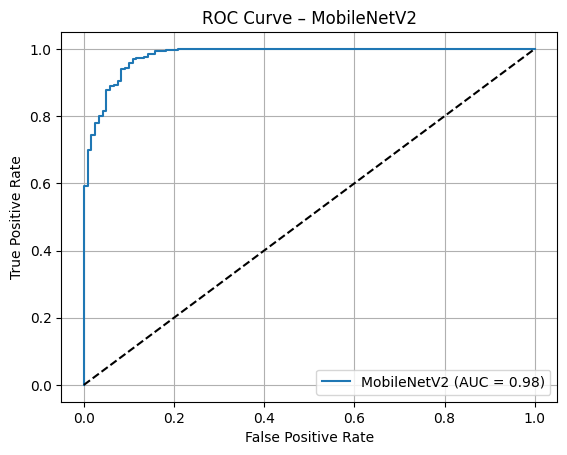

In [ ]:
evaluate_model(model_mobilenet, "MobileNetV2")

# **Interpretacja wyników dla modelu bazowego**

**1. Ogólna skuteczność modelu**
* **Accuracy: 0.99**
Model poprawnie sklasyfikował 99% wszystkich przykładów, co świadczy o bardzo wysokiej skuteczności ogólnej.

* **F1-score: 0.9941**
Całościowy wskaźnik efektywności modelu. Jest bardzo wysoki, co potwierdza świetne działanie modelu na danych dominujących.

**2. Wyniki dla poszczególnych klas**

**Klasa: graffiti**

* **Precision: 0.97**
Spośród wszystkich przykładów, które model zaklasyfikował jako „graffiti” 97% było poprawnych – bardzo wysoka precyzja.

* **Recall 0.73**
Model wykrył tylko 73% rzeczywistych przypadków graffiti, co oznacza, że 27% przykładów zostało źle sklasyfikowanych.

* **F1-score 0.83**
Średnia harmoniczna precyzji i czułości dla klasy „graffiti” pokazuje ogólną skuteczność wykrywania graffiti. Wartość 0.83 oznacza, że model radzi sobie dobrze, ale nie idealnie.

**Klasa: no_graffiti**

* **Precision 0.99**
Spośród przykładów zaklasyfikowanych jako „no_graffiti”, aż 99% to rzeczywiste obrazy bez graffiti.

* **Recall 1.00**
Wszystkie przypadki „no_graffiti” zostały prawidłowo rozpoznane – doskonała skuteczność klasyfikacji tej klasy.

* **F1-score 0.99**
Model osiągnął prawie idealny wynik dla klasy „no_graffiti”. Pokazuje, że model świetnie radzi sobie z rozpoznawaniem braku graffiti.

**3. Średnie wartości:**
* **Macro avg - Precision: 0.98**
Średnia precyzja obu klas pokazuje, że model generalnie bardzo trafnie identyfikuje pozytywne przypadki.

* **Macro avg – Recall: 0.87** Średnia czułość wskazuje, że choć „no_graffiti” wykrywane jest doskonale, „graffiti” jest często pomijane.

* **Macro avg – F1-score: 0.91**
Model dobrze balansuje skuteczność między klasami, ale wyniki są zaniżane przez słabsze rozpoznawanie graffiti.

* **Weighted avg - Precision: 0.99**
Model bardzo dobrze identyfikuje klasy zgodnie z ich rzeczywistym udziałem w danych (dominacja „no_graffiti”).

* **Weighted avg - Recall: 0.99**
Zdecydowana większość przypadków (w szczególności „no_graffiti”) została prawidłowo rozpoznana.

* **Weighted avg – F1-score: 0.99**
Ze względu na dominację klasy „no_graffiti”, wynik jest bardzo wysoki — ale może zakrywać słabości modelu dla klasy graffiti.

**4.Confusion Matrix**

* True Positives (TP) – model poprawnie wykrył 88 obrazów zawierających graffiti.

* False Negatives (FN) – model błędnie zaklasyfikował 32 obrazy z graffiti jako no_graffiti. To oznacza, że w 32 przypadkach graffiti zostało przeoczone – co wpływa negatywnie na recall tej klasy.

* False Positives (FP) – model błędnie zaklasyfikował 3 obrazy bez graffiti jako graffiti. Czyli wykrył graffiti tam, gdzie go nie było.

* True Negatives (TN) – model poprawnie rozpoznał 2973 obrazy jako no_graffiti – bardzo wysoki wynik, co przekłada się na wysoką precyzję dla tej klasy.

Model świetnie radzi sobie z rozpoznawaniem obrazów bez graffiti, czego dowodem jest aż 2973 prawidłowych klasyfikacji i tylko 3 błędne.
W przypadku obrazów z graffiti, model radzi sobie dobrze, ale nie idealnie – przeoczył 32 przypadki, co obniża jego czułość (recall) dla tej klasy.

**Interpretacja krzywej ROC**

Krzywa wznosi się stromo w lewy górny róg wykresu, co wskazuje na wysoką trafność i niską liczbę fałszywych alarmów. Taki kształt świadczy o tym, że model bardzo dobrze rozróżnia klasę graffiti od no_graffiti.

**AUC (Area Under Curve): 0.98**

Pole pod krzywą wynosi 0.98, co wskazuje na bardzo wysoką skuteczność klasyfikatora.

97/97 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step
Liczba błędnie sklasyfikowanych obrazów: 35


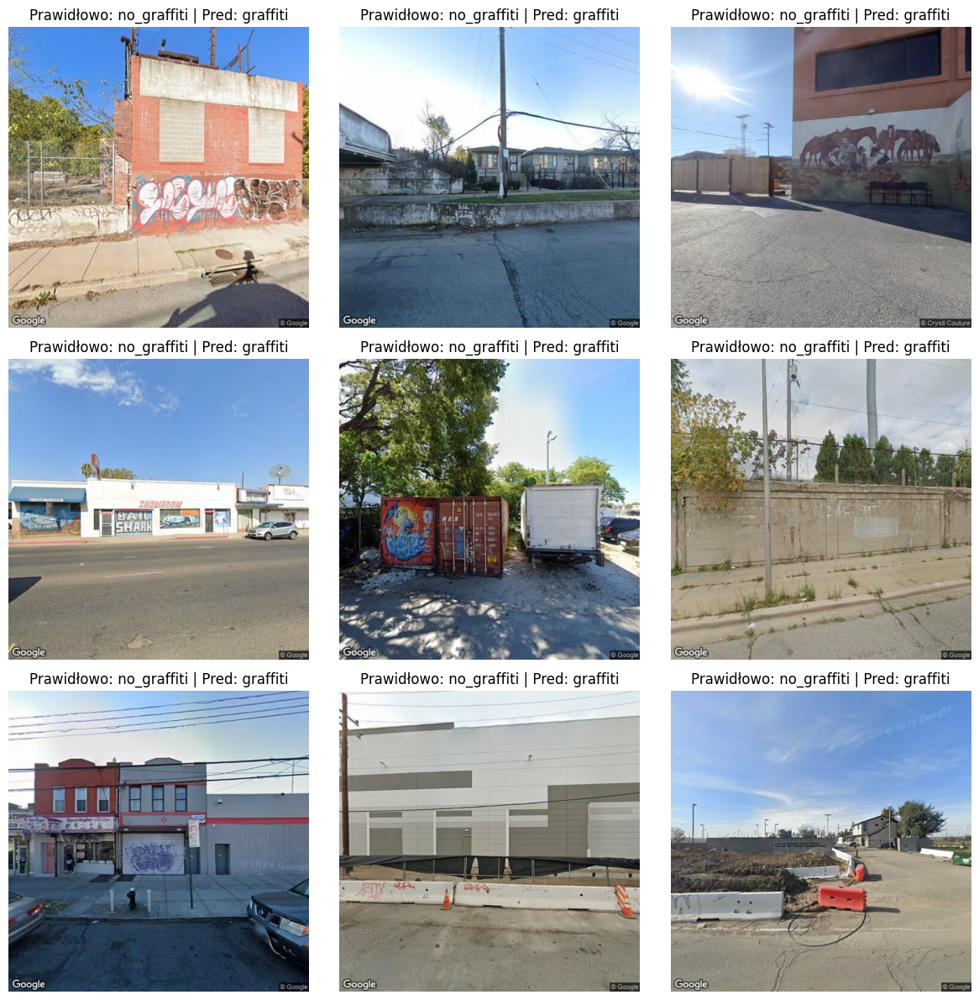

In [ ]:
show_misclassified_images(model_mobilenet, test_generator, ['no_graffiti', 'graffiti'])

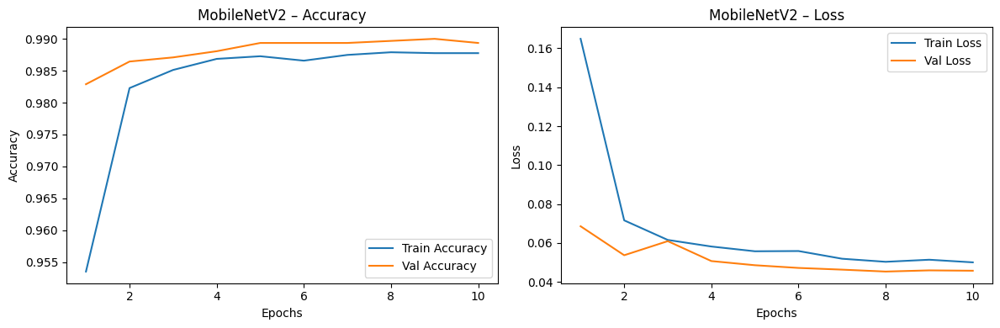

In [ ]:
plot_learning_curves(history_mobilenet, "MobileNetV2")

**Dokładność (Accuracy)**

Na wykresie dokładności widać bardzo szybki wzrost dokładności w pierwszych kilku epokach. Model już po 2–3 epokach osiąga wysoką skuteczność klasyfikacji, zarówno na zbiorze treningowym, jak i walidacyjnym. Pod koniec treningu dokładność utrzymuje się na bardzo wysokim poziomie — powyżej 98,5% dla obu zbiorów, z wartością maksymalną sięgającą około 99% na zbiorze walidacyjnym.

Co istotne, linie dokładności treningowej i walidacyjnej przebiegają bardzo blisko siebie, bez oznak dużych odchyleń. To oznacza, że model nie tylko dobrze uczy się danych treningowych, ale również bardzo dobrze generalizuje na dane, których nie widział wcześniej.

**Strata (Loss)**

Wykres funkcji straty również wskazuje na bardzo dobre dopasowanie modelu. Strata treningowa znacząco spada już w pierwszej epoce i dalej maleje w sposób umiarkowany. Strata walidacyjna również zmniejsza się wyraźnie i osiąga niższe wartości niż strata treningowa — co może sugerować, że model nie przeucza się, a wręcz działa bardziej efektywnie na danych walidacyjnych.

Brak gwałtownych skoków w wartościach funkcji straty świadczy o stabilności procesu uczenia. Różnice między stratą treningową i walidacyjną są niewielkie i zanikają w końcowych epokach.

97/97 ━━━━━━━━━━━━━━━━━━━━ 133s 1s/step
📄 [Model: MobileNetV2] – Classification Report:
              precision    recall  f1-score   support

    graffiti       0.98      0.83      0.90       120
 no_graffiti       0.99      1.00      1.00      2976

    accuracy                           0.99      3096
   macro avg       0.99      0.92      0.95      3096
weighted avg       0.99      0.99      0.99      3096

F1-score: 0.9963


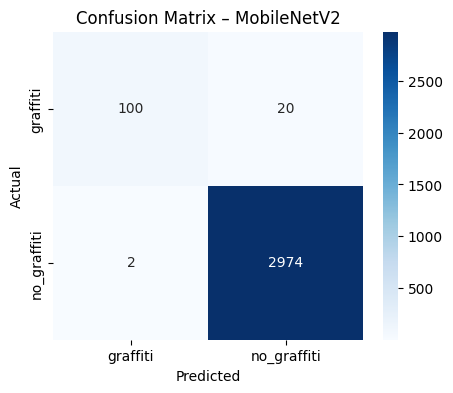

AUC: 0.9937


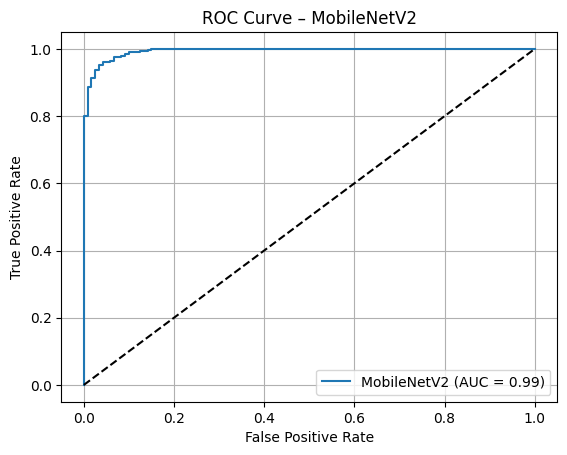

In [ ]:
evaluate_model(model_mobilenet_fine, "MobileNetV2")

# Interpretacja wyników (po fine-tuningu)

**1. Ogólna skuteczność modelu**
* **Accuracy: 0.99**
Dokładność modelu utrzymuje się na bardzo wysokim poziomie — model poprawnie sklasyfikował 99% przykładów.

* **F1-score: 0.9963**
Minimalnie wyższy niż przed fine-tuningiem (z 0.9941). Potwierdza lekką, ale istotną poprawę ogólnej skuteczności modelu.

**2. Wyniki dla poszczególnych klas**

**Klasa: graffiti**

* **Precision: 0.98**
Precyzja klasy „graffiti” uległa poprawie (z 0.97 do 0.98). Model bardzo rzadko myli inne obrazy z graffiti — oznacza to, że z bardzo dużym prawdopodobieństwem wykrywa graffiti.

* **Recall: 0.83**
Znacząca poprawa czułości dla klasy graffiti (z 0.73 do 0.83) — model przeoczył mniej przypadków graffiti niż wcześniej. Nadal nie idealnie, ale znacznie lepiej.

* **F1-score: 0.90**
Wzrost ogólnej skuteczności wykrywania graffiti (z 0.83 do 0.90) to efekt lepszej równowagi między precyzją a czułością. Model stał się bardziej użyteczny w praktycznym wykrywaniu graffiti.

**Klasa: no_graffiti**

* **Precision: 0.99**
Utrzymuje się na bardzo wysokim poziomie. Model nadal świetnie odróżnia obrazy bez graffiti.

* **Recall (no_graffiti) – 1.00** Brak pogorszenia. Model wykrył wszystkie przypadki „no_graffiti” bez pomyłek – tak jak przed fine-tuningiem.

* **F1-score (no_graffiti) – 1.00**
Model niemal perfekcyjnie klasyfikuje obrazy bez graffiti. Fine-tuning nie obniżył skuteczności dla tej klasy.

**Średnie wartości:**

* **Macro avg - Precision: 0.99**
Średnia precyzja dla obu klas jest bardzo wysoka — model trafnie klasyfikuje dane niezależnie od klasy.

* **Macro avg – Recall: 0.92**
Średnia czułość pokazuje, że wykrywanie „graffiti” jest zauważalnie lepsze niż w poprzednich wersjach, choć nadal nie idealne.

* **Macro avg - F1-score: 0.95**
Średnia skuteczność dla obu klas (ważone równo) wzrosła (z 0.91 do 0.95), co pokazuje, że model po fine-tuningu stał się bardziej zrównoważony między klasami.

* **Weighted avg - Precision: 0.99**
Model dobrze radzi sobie z klasą dominującej, przy jednoczesnym zachowaniu wysokiej jakości klasyfikacji graffiti.

* **Weighted avg - Recall: 0.99**
Prawie wszystkie przypadki zostały poprawnie sklasyfikowane, niezależnie od liczebności klas.

* **Weighted avg - F1-score: 0.99**
Wartość pozostała na tym samym wysokim poziomie. Model jest bardzo dokładny również po uwzględnieniu nierównowagi klas.


**4. Confusion Matrix**

* True Positives (TP) – model poprawnie rozpoznał 100 obrazów zawierających graffiti.

* False Negatives (FN) – model przeoczył 20 obrazów, na których występowało graffiti – zostały one błędnie zaklasyfikowane jako „no_graffiti”.

* False Positives (FP) – model błędnie zaklasyfikował 2 obrazy bez graffiti jako graffiti.

* True Negatives (TN) – model poprawnie rozpoznał 2974 obrazy jako „no_graffiti”.

W porównaniu do poprzedniego modelu (przed fine-tuningiem), liczba poprawnych wykryć graffiti wzrosła z 88 do 100, a liczba przeoczonych przypadków spadła z 32 do 20. To bezpośrednio przekłada się na wyższy recall (0.83) i F1-score (0.90) dla klasy „graffiti”.
Model nadal prawie bezbłędnie rozpoznaje obrazy bez graffiti – tylko 2 błędy na 2976 przykładów, co oznacza precision i recall bliskie 1.00 dla tej klasy.

**5. Krzywa ROC i AUC**

**Krzywa ROC** wznosi się bardzo stromo w górę i znajduje się blisko lewego górnego rogu wykresu. Oznacza to, że model bardzo dobrze odróżnia klasę pozytywną od negatywnej, czyli skutecznie rozróżnia obrazy zawierające graffiti od tych bez graffiti.

**AUC (Area Under Curve): 0.99**
Pole pod krzywą wynosi 0.99, co świadczy o bardzo wysokiej skuteczności klasyfikatora - jeszcze lepszą niż poprzednio.

97/97 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step
Liczba błędnie sklasyfikowanych obrazów: 22


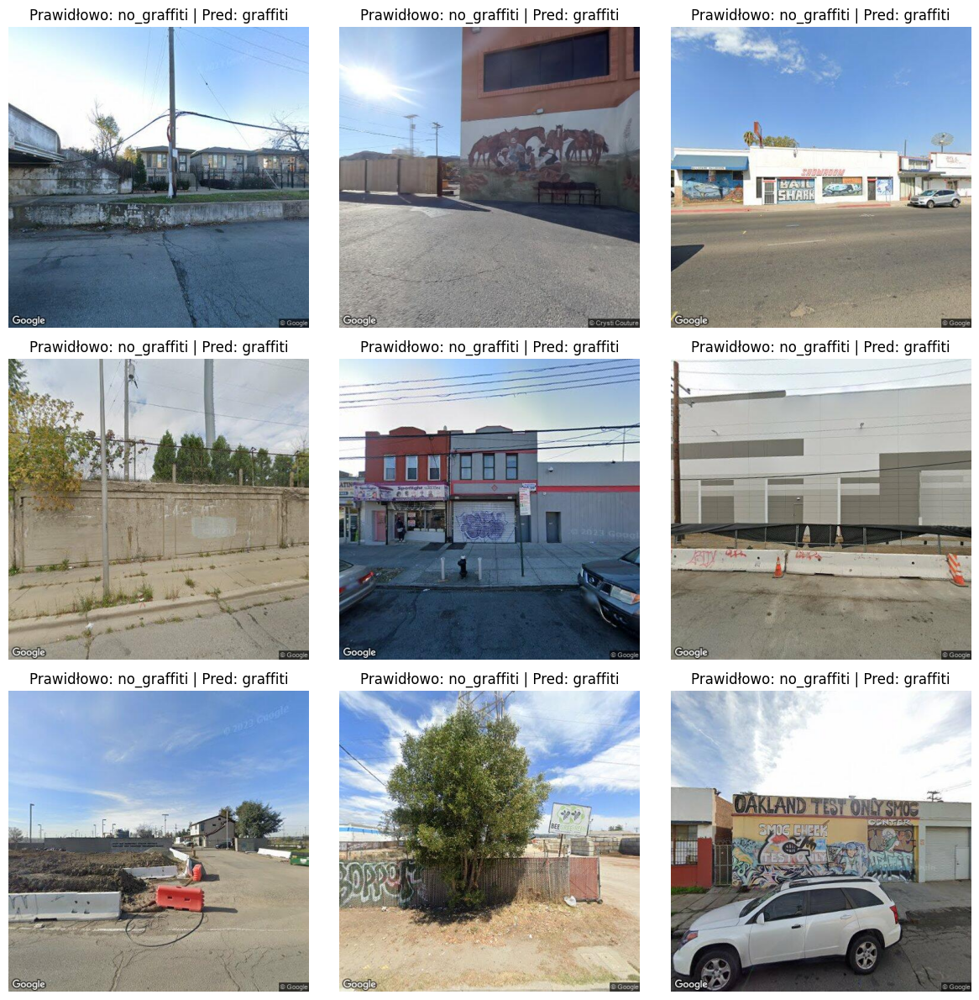

In [ ]:
show_misclassified_images(model_mobilenet_fine, test_generator, ['no_graffiti', 'graffiti'])

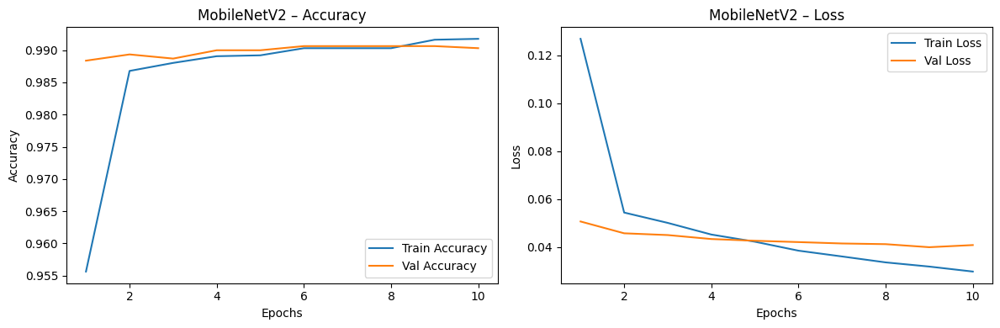

In [ ]:
plot_learning_curves(history_mobilenet_finetune, "MobileNetV2")

**Dokładność (Accuracy)**

Wykres dokładności pokazuje, że model bardzo szybko osiąga wysoką skuteczność. Już po kilku epokach dokładność treningowa przekracza 99%, a dokładność walidacyjna pozostaje na bardzo zbliżonym poziomie. To oznacza, że model nie tylko dobrze uczy się na danych treningowych, ale również potrafi skutecznie generalizować na dane, których wcześniej nie widział. Brak wyraźnej różnicy między krzywymi dokładności treningowej i walidacyjnej świadczy o tym, że nie występuje problem nadmiernego dopasowania (overfittingu).

**Strata (Loss)**

Wykres straty wskazuje, że model konsekwentnie zmniejsza stratę na zbiorze treningowym w miarę postępu treningu. Strata walidacyjna również maleje w pierwszych epokach, jednak po około szóstej epoce przestaje się poprawiać i delikatnie wzrasta. Mimo tego niewielkiego wzrostu, ogólna różnica między stratą treningową a walidacyjną pozostaje nieduża. Może to sugerować wczesny początek overfittingu, ale w praktyce model nadal prezentuje bardzo dobrą stabilność i ogólną jakość.

# Transfer learning - ResNet50



In [ ]:
# Załaduj bazowy model
#base_model = ResNet50(input_shape=(224, 224, 3),
                        #  include_top=False,
                        #  weights='imagenet')

# Zamrożenie wszystkich warstw modelu bazowego
#base_model.trainable = False

# Dodanie własnych warstw
# x = base_model.output
# x = GlobalAveragePooling2D()(x)
# x = Dropout(0.5)(x)
# x = Dense(128, activation='relu')(x)
# x = Dropout(0.3)(x)
# predictions = Dense(2, activation='softmax')(x)  # 2 klasy

# Budowa modelu końcowego
#model_resnet = Model(inputs=base_model.input, outputs=predictions)

# Kompilacja modelu – wstępny trening (bez fine-tuningu)
#model_resnet.compile(optimizer=Adam(learning_rate=1e-4),
              # loss='categorical_crossentropy',
              # metrics=['accuracy'])

# Trening wstępny (z zamrożonymi warstwami)
# history_resnet = model_resnet.fit(
#     train_generator,
#     validation_data=val_generator,
#     epochs=10,
#     callbacks=[
#         EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
#         ModelCheckpoint('resnet_initial.h5', save_best_only=True)
#     ]
# )

# Odmrożenie części warstw bazowego modelu
# base_model.trainable = True
# for layer in base_model.layers[:-30]: ## Odmrażamy ostatnie ~30 warstw
#     layer.trainable = False

# Kompilacja z niższym LR
# model_resnet.compile(optimizer=Adam(learning_rate=1e-5),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# Trening fine-tuning
# history_resnet_tune = model_resnet.fit(
#     train_generator,
#     validation_data=val_generator,
#     epochs=10,
#     callbacks=[
#         EarlyStopping(patience=3, restore_best_weights=True),
#         ModelCheckpoint('resnet_finetuned.h5', save_best_only=True)
#     ]
# )

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 563ms/step - accuracy: 0.9560 - loss: 0.1878

452/452 ━━━━━━━━━━━━━━━━━━━━ 289s 616ms/step - accuracy: 0.9561 - loss: 0.1877 - val_accuracy: 0.9680 - val_loss: 0.1286
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.9704 - loss: 0.1273

452/452 ━━━━━━━━━━━━━━━━━━━━ 271s 601ms/step - accuracy: 0.9704 - loss: 0.1273 - val_accuracy: 0.9725 - val_loss: 0.1215
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.9666 - loss: 0.1385

452/452 ━━━━━━━━━━━━━━━━━━━━ 271s 600ms/step - accuracy: 0.9666 - loss: 0.1385 - val_accuracy: 0.9706 - val_loss: 0.1119
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 271s 600ms/step - accuracy: 0.9681 - loss: 0.1330 - val_accuracy: 0.9732 - val_loss: 0.1222
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 271s 601ms/step - accuracy: 0.9731 - loss: 0.1180 - val_accuracy: 0.9735 - val_loss: 0.1287
Epoch 6/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 269s 594ms/step - accuracy: 0.9696 - loss: 0.1327 - val_accuracy: 0.9735 - val_loss: 0.1168
Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 600ms/step - accuracy: 0.8614 - loss: 0.5214

452/452 ━━━━━━━━━━━━━━━━━━━━ 308s 653ms/step - accuracy: 0.8616 - loss: 0.5206 - val_accuracy: 0.9816 - val_loss: 0.0693
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 603ms/step - accuracy: 0.9803 - loss: 0.0827

452/452 ━━━━━━━━━━━━━━━━━━━━ 294s 651ms/step - accuracy: 0.9803 - loss: 0.0827 - val_accuracy: 0.9845 - val_loss: 0.0604
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 600ms/step - accuracy: 0.9808 - loss: 0.0732

452/452 ━━━━━━━━━━━━━━━━━━━━ 320s 648ms/step - accuracy: 0.9809 - loss: 0.0732 - val_accuracy: 0.9861 - val_loss: 0.0590
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 600ms/step - accuracy: 0.9845 - loss: 0.0648

452/452 ━━━━━━━━━━━━━━━━━━━━ 322s 648ms/step - accuracy: 0.9845 - loss: 0.0648 - val_accuracy: 0.9871 - val_loss: 0.0544
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 605ms/step - accuracy: 0.9823 - loss: 0.0669

452/452 ━━━━━━━━━━━━━━━━━━━━ 324s 653ms/step - accuracy: 0.9823 - loss: 0.0669 - val_accuracy: 0.9874 - val_loss: 0.0518
Epoch 6/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 293s 648ms/step - accuracy: 0.9838 - loss: 0.0684 - val_accuracy: 0.9851 - val_loss: 0.0598
Epoch 7/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 319s 642ms/step - accuracy: 0.9837 - loss: 0.0751 - val_accuracy: 0.9835 - val_loss: 0.0723
Epoch 8/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 601ms/step - accuracy: 0.9838 - loss: 0.0661

452/452 ━━━━━━━━━━━━━━━━━━━━ 324s 646ms/step - accuracy: 0.9838 - loss: 0.0661 - val_accuracy: 0.9880 - val_loss: 0.0512
Epoch 9/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 322s 645ms/step - accuracy: 0.9835 - loss: 0.0703 - val_accuracy: 0.9861 - val_loss: 0.0549
Epoch 10/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 290s 641ms/step - accuracy: 0.9835 - loss: 0.0665 - val_accuracy: 0.9858 - val_loss: 0.0580


In [ ]:
#załadowanie modeli
model_resnet = load_model('resnet_initial.h5')
model_resnet_tune = load_model('resnet_finetuned.h5')

In [ ]:
# #zapisanie historii przebiegu

# # Po treningu wstępnym
# with open("history_resnet.pkl", "wb") as f:
#     pickle.dump(history_resnet.history, f)

# # Po fine-tuningu
# with open("history_resnet_tune.pkl", "wb") as f:
#     pickle.dump(history_resnet_tune.history, f)

In [ ]:
#Wczytanie historii przebiegu
with open("history_resnet.pkl", "rb") as f:
    history_resnet = pickle.load(f)

with open("history_resnet_tune.pkl", "rb") as f:
    history_resnet_tune = pickle.load(f)

97/97 ━━━━━━━━━━━━━━━━━━━━ 556s 6s/step
📄 [Model: ResNet50] – Classification Report:
              precision    recall  f1-score   support

    graffiti       1.00      0.27      0.42       120
 no_graffiti       0.97      1.00      0.99      2976

    accuracy                           0.97      3096
   macro avg       0.99      0.63      0.70      3096
weighted avg       0.97      0.97      0.96      3096

F1-score: 0.9854


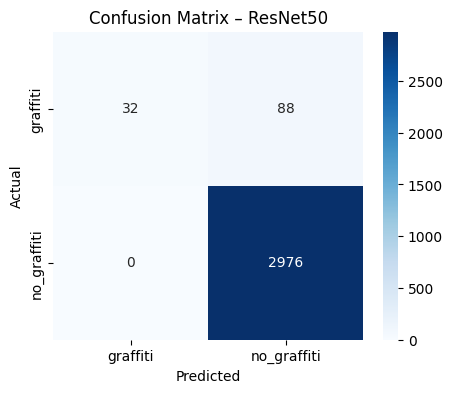

AUC: 0.8143


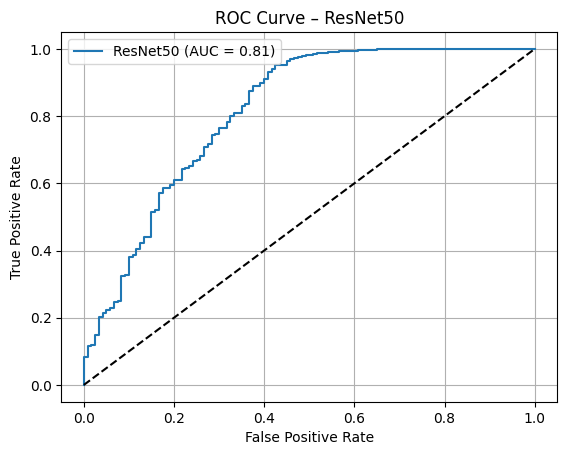

In [ ]:
evaluate_model(model_resnet, "ResNet50")

# Interpretacja wyników dla modelu bazowego:

**1. Ogólna skuteczność modelu**
* **Accuracy: 0.97**
Model poprawnie sklasyfikował 97% przykładów. To pozornie wysoki wynik, ale ze względu na silną nierównowagę klas (dużo więcej przykładów „no_graffiti”), accuracy nie oddaje realnej skuteczności w wykrywaniu graffiti.

* **F1-score : 0.9854**
Całościowy wynik wygląda dobrze, ale w rzeczywistości nie oddaje słabej skuteczności wykrywania graffiti.

**2. Wyniki dla poszczególnych klas**

**Klasa: graffiti**

* **Precision (graffiti): 1.00**
Model był bezbłędny w przewidywaniach klasy „graffiti”.

* **Recall: 0.27**
Model wykrył tylko 27% rzeczywistych przypadków graffiti. To bardzo niski wynik, oznaczający, że aż 73% przypadków graffiti zostało przeoczonych.

* **F1-score 0.42**
Łączna skuteczność wykrywania graffiti jest bardzo niska – model praktycznie nie potrafi wychwytywać graffiti. Choć nigdy się nie myli, gdy wykrywa graffiti, to niemal nigdy go nie wykrywa, co czyni go mało użytecznym w praktyce.

**Klasa: no_graffiti**

* **Precision: 0.97**
Dla klasy dominującej model uzyskuje bardzo dobrą precyzję – tylko niewielka liczba przypadków „no_graffiti” została błędnie rozpoznana jako graffiti.

* **Recall 1.00**
Model wykrył wszystkie przypadki bez graffiti – nie przeoczył żadnego.

* **F1-score 0.99**
Model działa niemal perfekcyjnie dla klasy „no_graffiti”. To typowe w modelach uczonych na niezrównoważonych zbiorach, gdy brakuje mechanizmów balansu klas.

**3. Średnie wartości**

* **Macro avg - Precision: 0.99**
Średnia precyzja obu klas jest bardzo wysoka, ale nie oddaje faktycznych problemów z wykrywaniem graffiti.

* **Macro avg – Recall: 0.63**
Wynik zaniżony przez bardzo niską czułość dla klasy „graffiti”.

* **Macro avg - F1-score: 0.70**
Średnia F1-score dla obu klas jest niska — to efekt bardzo słabego wyniku dla klasy graffiti. Model bardzo słabo radzi sobie z mniejszościową klasą.

* **Weighted avg - Precision: 0.97**
Precyzja ważona udziałem klas jest wysoka, ponieważ dominująca klasa została dobrze sklasyfikowana.

* **Weighted avg - Recall: 0.97**
Model poprawnie rozpoznał 97% przypadków ze wszystkich klas — ale głównie za sprawą „no_graffiti”.

* **Weighted avg - F1-score: 0.96**
Ze względu na dominację klasy „no_graffiti”, model uzyskuje wysoki F1-score ważony, ale ta metryka może być myląca, ponieważ maskuje niski wynik dla klasy graffiti.

**4. Confusion Matrix:**
* True Positives (TP) – model prawidłowo rozpoznał 32 przypadki graffiti.

* False Negatives (FN) – model przeoczył aż 88 przypadków graffiti, klasyfikując je błędnie jako „no_graffiti”. To bardzo wysoka liczba błędów – odpowiadająca recallowi 0.27 dla klasy „graffiti”.

* False Positives (FP) –
Model ani razu nie pomylił obrazu bez graffiti z graffiti. To wyjaśnia idealną precyzję (1.00) dla klasy „graffiti”.

* True Negatives (TN) – wszystkie obrazy bez graffiti zostały poprawnie sklasyfikowane.

Model ResNet50 jest wysoce zachowawczy – wykrywa graffiti tylko wtedy, gdy jest tego absolutnie pewny, przez co nie klasyfikuje obszarów z grafiti jako czystych, ale za to często myli się i klasyfikuje "no_graffiti" jako grafitii.

**5. Krzywa ROC i AUC**

**Krzywa ROC** wznosi się umiarkowanie stromo i znajduje się wyraźnie powyżej linii referencyjnej (czarnej przerywanej linii), jednak jest dalej od lewego górnego rogu wykresu niż w przypadku idealnego klasyfikatora. Oznacza to, że model w dość dobrym stopniu odróżnia klasę pozytywną od negatywnej, choć jego skuteczność jest niższa niż w przypadku MobileNetV2.

**AUC (Area Under Curve): 0.81**
Pole pod krzywą wynosi 0.81, co świadczy o dobrej, choć nie idealnej skuteczności klasyfikatora.

97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 220ms/step
Liczba błędnie sklasyfikowanych obrazów: 89


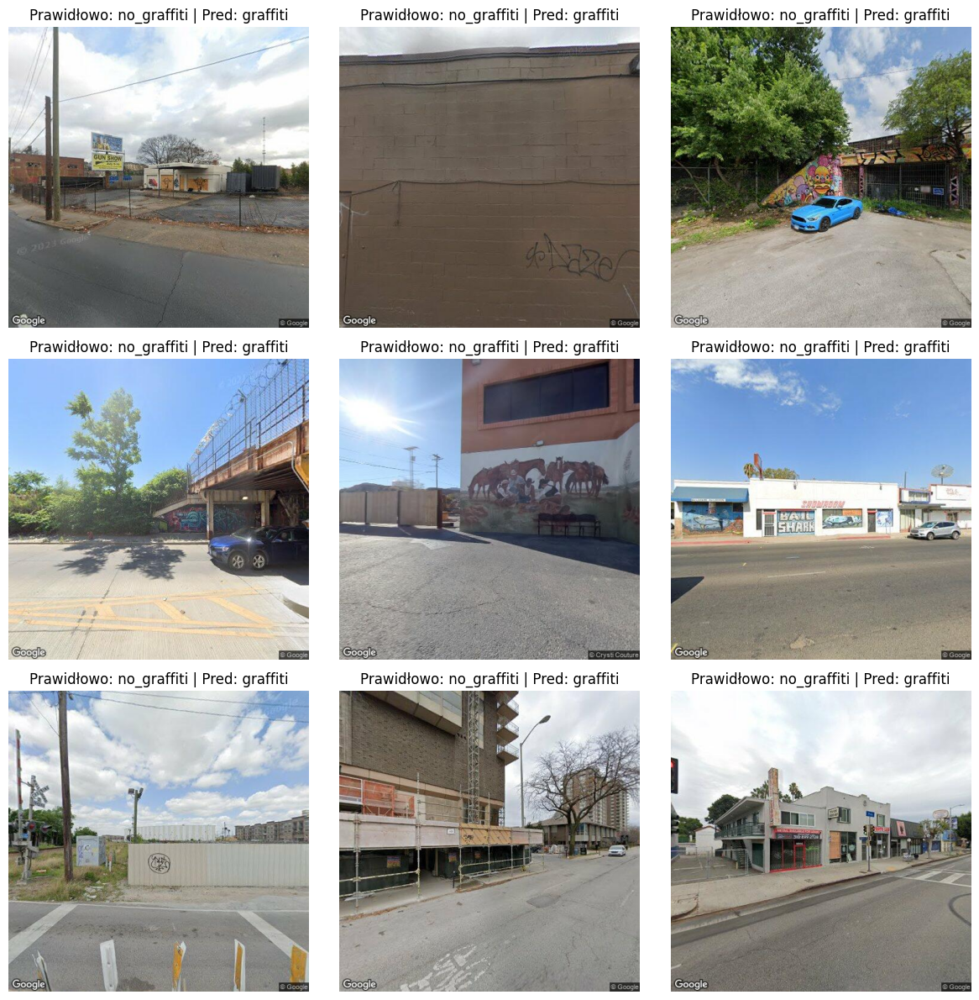

In [ ]:
show_misclassified_images(model_resnet, test_generator, ['no_graffiti', 'graffiti'])

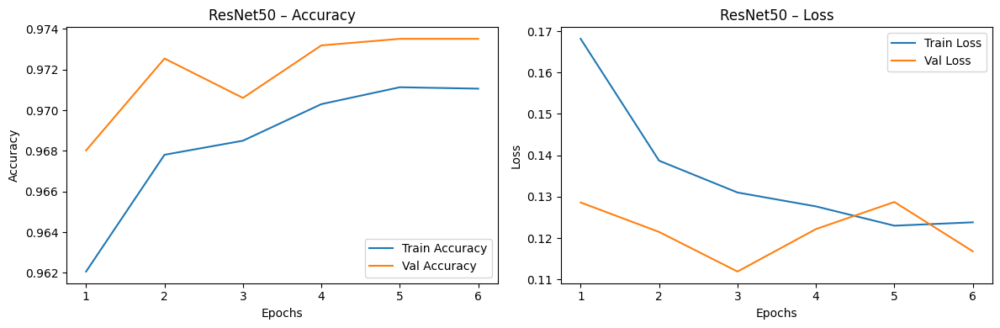

In [ ]:
plot_learning_curves(history_resnet, "ResNet50")

**Dokładność (Accuracy)**

Wykres dokładności pokazuje, że model ResNet50 stopniowo poprawia swoje wyniki na danych treningowych, osiągając coraz wyższą dokładność z każdą kolejną epoką. Dokładność walidacyjna od samego początku jest wyższa niż treningowa, co może wskazywać na to, że model bardzo dobrze radzi sobie z generalizacją. W dalszych epokach obie krzywe się do siebie zbliżają, a dokładność walidacyjna stabilizuje się na poziomie około 97,4%. To sugeruje, że model jest dobrze wytrenowany, a jego skuteczność na danych, których wcześniej nie widział, jest bardzo wysoka.

**Strata (Loss)**

Wykres straty pokazuje wyraźny spadek wartości loss dla danych treningowych, co świadczy o skutecznym procesie uczenia. W przypadku danych walidacyjnych widać pewne wahania — po początkowym spadku następuje niewielki wzrost w czwartej i piątej epoce, po czym strata znowu się obniża. Te niewielkie zmiany mogą wskazywać na lekką niestabilność w uczeniu, ale ogólna różnica między stratą treningową i walidacyjną nie jest duża. Model utrzymuje dobrą równowagę między nauką a generalizacją, bez wyraźnych oznak overfittingu.

97/97 ━━━━━━━━━━━━━━━━━━━━ 601s 6s/step
📄 [Model: ResNet50] – Classification Report:
              precision    recall  f1-score   support

    graffiti       0.98      0.68      0.80       120
 no_graffiti       0.99      1.00      0.99      2976

    accuracy                           0.99      3096
   macro avg       0.98      0.84      0.90      3096
weighted avg       0.99      0.99      0.99      3096

F1-score: 0.9932


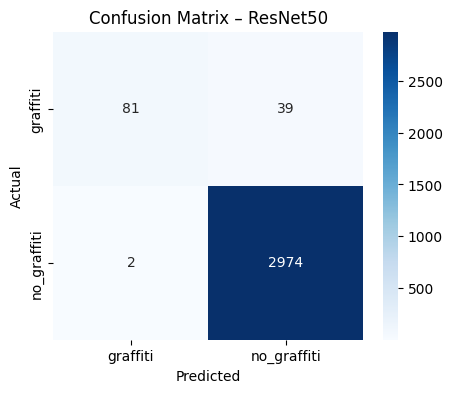

AUC: 0.9559


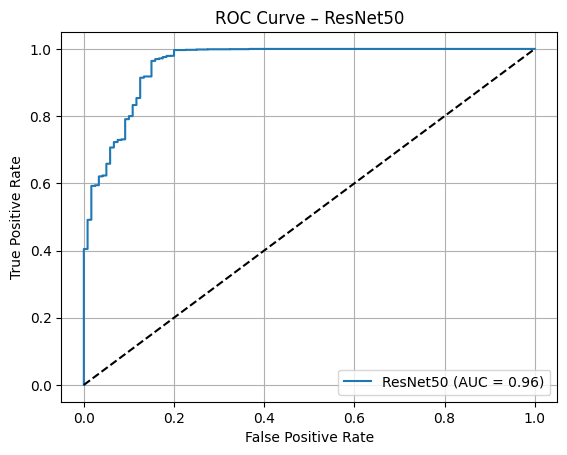

In [ ]:
evaluate_model(model_resnet_tune, "ResNet50")

# Interpretacja wyników (po fine-tuningu)

**1. Ogólna skuteczność modelu**
* **Accuracy: 0.99**
Model poprawnie sklasyfikował 99% przykładów, co jest wyraźną poprawą względem wersji przed fine-tuningiem.

* **F1-score: 0.9932**
Wysoki ogólny F1-score wskazuje na bardzo dobrą równowagę między precyzją a czułością, choć dominuje wpływ klasy „no_graffiti”.

**2. Wyniki dla poszczególnych klas**

**Klasa: graffiti**

* **Precision: 0.98**
Spośród wszystkich przypadków zaklasyfikowanych jako „graffiti”, 98% to rzeczywiste graffiti — model niemal nie generuje fałszywych pozytywów.

* **Recall: 0.68**
Recall dla klasy graffiti znacznie się poprawił (z 0.27 do 0.68). Model wykrywa teraz 68% rzeczywistych przypadków graffiti, co oznacza, że przeoczenia zostały mocno ograniczone. To nadal nie jest idealny wynik, ale jest spory postęp.

* **F1-score: 0.80**
Łączna skuteczność wykrywania graffiti wzrosła z 0.42 do 0.80, co pokazuje, że model lepiej balansuje precyzję i recall dla trudniejszej klasy, choć ograniczona czułość ciągle obniża skuteczność.

**Klasa: no_graffiti**

* **Precision: 0.99**
Model utrzymał bardzo wysoką precyzję dla klasy dominującej — praktycznie wszystkie przykłady bez graffiti są prawidłowo klasyfikowane.

* **Recall: 1.00**
Model nie przeoczył żadnego przypadku no_graffiti — to oznacza, że wszystkie obrazy bez graffiti zostały poprawnie rozpoznane.

* **F1-score: 0.99**
Bardzo wysoka skuteczność również dla tej klasy, praktycznie idealna.

**3. Średnie wartości:**

* **Macro avg - Precision: 0.98**
Model bardzo precyzyjnie klasyfikuje obie klasy, bez względu na ich liczebność.

* **Macro avg – Recall: 0.84**
Średnia czułość pokazuje, że model nadal gorzej radzi sobie z wykrywaniem graffiti niż no_graffiti.

* **Macro avg - F1-score: 0.90**
Średnia F1-score licząc obie klasy jednakowo wskazuje na znaczne polepszenie modelu. Model osiąga dużo lepszą równowagę między wykrywaniem graffiti i no_graffiti.

* **Weighted avg - Precision: 0.99**
Model bardzo dobrze klasyfikuje dane w ujęciu liczebności klas.

* **Weighted avg - Recall: 0.99**
Prawie wszystkie przypadki zostały prawidłowo sklasyfikowane, niezależnie od klasy.

* **Weighted avg (F1-score): 0.99**
Ze względu na przewagę klasy no_graffiti, ważona średnia jest bardzo wysoka, co potwierdza bardzo dobrą ogólną skuteczność.

Fine-tuning modelu ResNet50 znacząco poprawił jego zdolność do wykrywania graffiti, zwłaszcza poprzez wzrost recall z 0.27 do 0.68. Nadal model pozostaje bardzo precyzyjny i zachowuje wysoką dokładność w rozpoznawaniu obu klas, co czyni go dużo bardziej użytecznym w praktyce.

97/97 ━━━━━━━━━━━━━━━━━━━━ 24s 228ms/step
Liczba błędnie sklasyfikowanych obrazów: 36


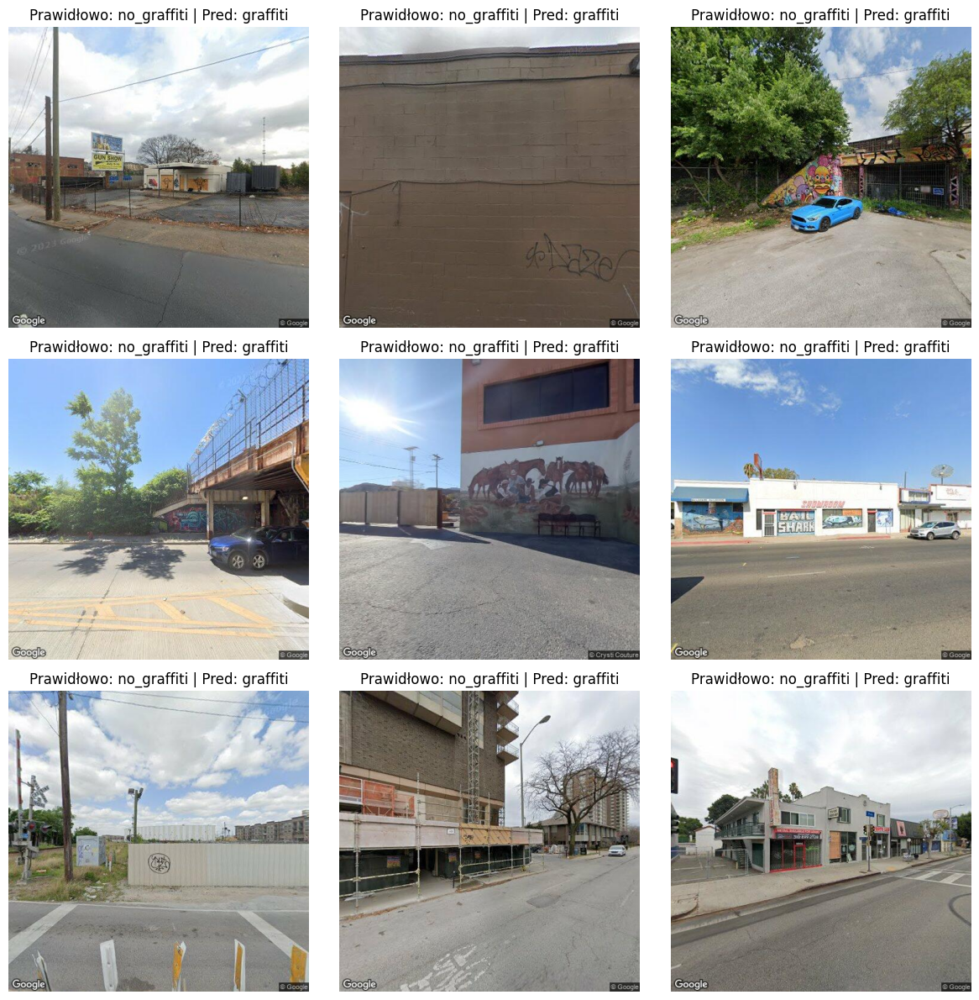

In [ ]:
show_misclassified_images(model_resnet_tune, test_generator, ['no_graffiti', 'graffiti'])

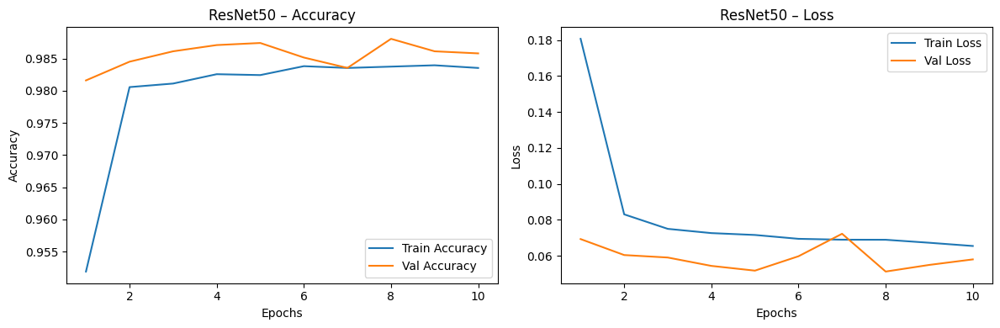

In [ ]:
plot_learning_curves(history_resnet_tune, "ResNet50")

**Dokładność (Accuracy)**

Wykres dokładności pokazuje, że model bardzo szybko osiąga wysoką skuteczność już po drugiej epoce, po czym jego dokładność delikatnie rośnie lub stabilizuje się. Co istotne, dokładność walidacyjna od początku jest nieco wyższa niż treningowa i utrzymuje się na poziomie około 98,5%. Niewielkie wahania między epokami są naturalne i nie wskazują na żaden poważny problem. Różnica między krzywymi jest minimalna, co sugeruje, że model dobrze generalizuje i nie przeucza się.

**Strata (Loss)**

Wykres straty pokazuje bardzo szybki spadek wartości loss na początku treningu, szczególnie między pierwszą a drugą epoką. W kolejnych epokach strata treningowa spada już wolniej, ale systematycznie. Strata walidacyjna również początkowo maleje, jednak od szóstej epoki pojawiają się pewne wahania. Mimo tych wahań ogólny poziom straty walidacyjnej pozostaje niski, a różnice między stratami są niewielkie. Model prezentuje więc dobrą stabilność i zachowuje równowagę między dopasowaniem do danych a zdolnością generalizacji.



# Transfer Learning EfficientNet-B0

In [ ]:
# #Załaduj bazowy model
# base_model = EfficientNetB0(input_shape=(224, 224, 3),
#                          include_top=False,
#                          weights='imagenet')

# #Zamrożenie wszystkich warstw modelu bazowego
# base_model.trainable = False

# #Dodanie własnych warstw
# x = base_model.output
# x = GlobalAveragePooling2D()(x)
# x = Dropout(0.5)(x)
# x = Dense(128, activation='relu')(x)
# x = Dropout(0.3)(x)
# predictions = Dense(2, activation='softmax')(x)  # 2 klasy

# #Budowa modelu końcowego
# model_effnet = Model(inputs=base_model.input, outputs=predictions)

# #Kompilacja modelu – wstępny trening (bez fine-tuningu)
# model_effnet.compile(optimizer=Adam(learning_rate=1e-4),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# #Trening wstępny (z zamrożonymi warstwami)
# history_effnet = model_effnet.fit(
#     train_generator,
#     validation_data=val_generator,
#     epochs=10,
#     callbacks=[
#         EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True),
#         ModelCheckpoint('effnet_initial.h5', save_best_only=True)
#     ]
# )

# #Odmrożenie części warstw bazowego modelu
# base_model.trainable = True
# for layer in base_model.layers[:-30]: ## Odmrażamy ostatnie ~30 warstw
#     layer.trainable = False

# #Kompilacja z niższym LR
# model_effnet.compile(optimizer=Adam(learning_rate=1e-5),
#               loss='categorical_crossentropy',
#               metrics=['accuracy'])

# #Trening fine-tuning
# history_effnet_finetune = model_effnet.fit(
#     train_generator,
#     validation_data=val_generator,
#     epochs=10,
#     callbacks=[
#         EarlyStopping(patience=3, restore_best_weights=True),
#         ModelCheckpoint('effnet_finetuned.h5', save_best_only=True)
#     ]
# )

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 609ms/step - accuracy: 0.9504 - loss: 0.2024

452/452 ━━━━━━━━━━━━━━━━━━━━ 313s 654ms/step - accuracy: 0.9504 - loss: 0.2024 - val_accuracy: 0.9612 - val_loss: 0.1645
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 316s 649ms/step - accuracy: 0.9635 - loss: 0.1628 - val_accuracy: 0.9612 - val_loss: 0.1691
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 295s 589ms/step - accuracy: 0.9593 - loss: 0.1772 - val_accuracy: 0.9612 - val_loss: 0.1656
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.9618 - loss: 0.1666

452/452 ━━━━━━━━━━━━━━━━━━━━ 260s 574ms/step - accuracy: 0.9618 - loss: 0.1666 - val_accuracy: 0.9612 - val_loss: 0.1613
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 277s 614ms/step - accuracy: 0.9635 - loss: 0.1598 - val_accuracy: 0.9612 - val_loss: 0.1622
Epoch 6/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 607ms/step - accuracy: 0.9607 - loss: 0.1667

452/452 ━━━━━━━━━━━━━━━━━━━━ 291s 644ms/step - accuracy: 0.9607 - loss: 0.1667 - val_accuracy: 0.9612 - val_loss: 0.1605
Epoch 7/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 594ms/step - accuracy: 0.9612 - loss: 0.1658

452/452 ━━━━━━━━━━━━━━━━━━━━ 290s 641ms/step - accuracy: 0.9612 - loss: 0.1658 - val_accuracy: 0.9612 - val_loss: 0.1605
Epoch 8/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 577ms/step - accuracy: 0.9622 - loss: 0.1605

452/452 ━━━━━━━━━━━━━━━━━━━━ 310s 614ms/step - accuracy: 0.9622 - loss: 0.1605 - val_accuracy: 0.9612 - val_loss: 0.1601
Epoch 9/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 584ms/step - accuracy: 0.9624 - loss: 0.1620

452/452 ━━━━━━━━━━━━━━━━━━━━ 329s 630ms/step - accuracy: 0.9624 - loss: 0.1620 - val_accuracy: 0.9612 - val_loss: 0.1592
Epoch 10/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 312s 608ms/step - accuracy: 0.9606 - loss: 0.1680 - val_accuracy: 0.9612 - val_loss: 0.1593
Epoch 1/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 585ms/step - accuracy: 0.8281 - loss: 0.4909

452/452 ━━━━━━━━━━━━━━━━━━━━ 301s 629ms/step - accuracy: 0.8283 - loss: 0.4905 - val_accuracy: 0.9612 - val_loss: 0.1668
Epoch 2/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 591ms/step - accuracy: 0.9607 - loss: 0.1670

452/452 ━━━━━━━━━━━━━━━━━━━━ 288s 638ms/step - accuracy: 0.9607 - loss: 0.1670 - val_accuracy: 0.9612 - val_loss: 0.1571
Epoch 3/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 588ms/step - accuracy: 0.9601 - loss: 0.1686

452/452 ━━━━━━━━━━━━━━━━━━━━ 282s 623ms/step - accuracy: 0.9601 - loss: 0.1686 - val_accuracy: 0.9616 - val_loss: 0.1528
Epoch 4/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 586ms/step - accuracy: 0.9612 - loss: 0.1577

452/452 ━━━━━━━━━━━━━━━━━━━━ 281s 622ms/step - accuracy: 0.9612 - loss: 0.1577 - val_accuracy: 0.9616 - val_loss: 0.1509
Epoch 5/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 605ms/step - accuracy: 0.9604 - loss: 0.1610

452/452 ━━━━━━━━━━━━━━━━━━━━ 295s 652ms/step - accuracy: 0.9604 - loss: 0.1610 - val_accuracy: 0.9616 - val_loss: 0.1438
Epoch 6/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 295s 592ms/step - accuracy: 0.9636 - loss: 0.1438 - val_accuracy: 0.9622 - val_loss: 0.1519
Epoch 7/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 288s 638ms/step - accuracy: 0.9627 - loss: 0.1520 - val_accuracy: 0.9625 - val_loss: 0.1459
Epoch 8/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.9630 - loss: 0.1498

452/452 ━━━━━━━━━━━━━━━━━━━━ 272s 602ms/step - accuracy: 0.9630 - loss: 0.1498 - val_accuracy: 0.9641 - val_loss: 0.1371
Epoch 9/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.9668 - loss: 0.1378

452/452 ━━━━━━━━━━━━━━━━━━━━ 276s 611ms/step - accuracy: 0.9668 - loss: 0.1378 - val_accuracy: 0.9645 - val_loss: 0.1348
Epoch 10/10
452/452 ━━━━━━━━━━━━━━━━━━━━ 279s 616ms/step - accuracy: 0.9672 - loss: 0.1317 - val_accuracy: 0.9648 - val_loss: 0.1459


In [ ]:
#Wczytanie modeli
model_effnet = load_model('effnet_initial.h5')
model_effnet_tune = load_model('effnet_finetuned.h5')

In [ ]:
# #zapisanie historii przebiegu

# # Po treningu wstępnym
# with open("history_effnet.pkl", "wb") as f:
#     pickle.dump(history_effnet.history, f)

# # Po fine-tuningu
# with open("history_effnet_finetune.pkl", "wb") as f:
#     pickle.dump(history_effnet_finetune.history, f)

In [ ]:
#wczytanie historii przebiegu
with open("history_effnet.pkl", "rb") as f:
    history_effnet = pickle.load(f)

with open("history_effnet_finetune.pkl", "rb") as f:
    history_effnet_tune = pickle.load(f)

97/97 ━━━━━━━━━━━━━━━━━━━━ 277s 3s/step
📄 [Model: EfficientNet-B0] – Classification Report:
              precision    recall  f1-score   support

    graffiti       0.00      0.00      0.00       120
 no_graffiti       0.96      1.00      0.98      2976

    accuracy                           0.96      3096
   macro avg       0.48      0.50      0.49      3096
weighted avg       0.92      0.96      0.94      3096

F1-score: 0.9802


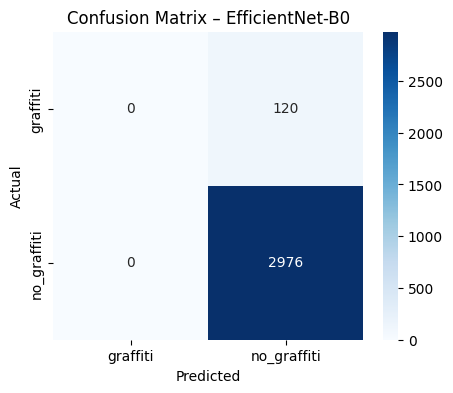

AUC: 0.8121


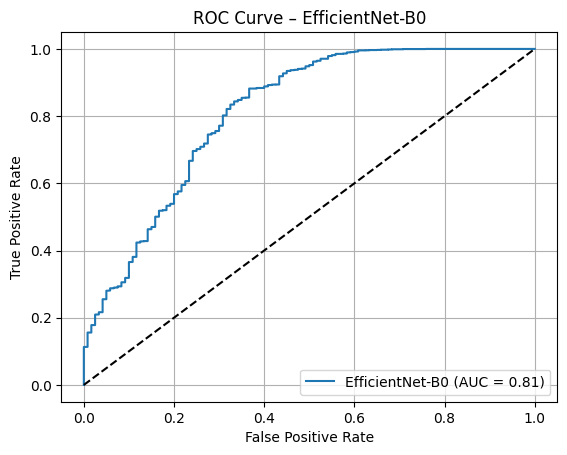

In [ ]:
evaluate_model(model_effnet, "EfficientNet-B0")

# Interpretacja wyników dla modelu bazowego:

**1. Ogólna skuteczność modelu**
* **Accuracy: 0.96**
Model poprawnie sklasyfikował 96% wszystkich przykładów, co może wyglądać dobrze, ale jest mylące – przy tak dużej nierównowadze klas accuracy nie mówi wiele o realnej skuteczności w wykrywaniu graffiti.

* **F1-score: 0.98**
Wynik wygląda dobrze, ale jest zawyżony przez dominację klasy no_graffiti.

**2. Wyniki dla poszczególnych klas**

**Klasa: graffiti**

* **Precision: 0.00**
Model ani razu nie zaklasyfikował żadnego obrazu jako graffiti– nie miał żadnych trafnych pozytywnych klasyfikacji (True Positives), a jeśli nawet coś zaklasyfikował jako graffiti, to zawsze się mylił.

* **Recall: 0.00**
Model nie wykrył żadnego z 120 przypadków graffiti. Wszystkie zostały błędnie zaklasyfikowane jako no_graffiti.

* **F1-score: 0.00**
Zarówno precision, jak i recall dla graffiti są zerowe, więc F1-score również.

**Klasa: no_graffiti**
* **Precision: 0.96**
Model prawidłowo rozpoznaje większość przypadków no_graffiti, choć nie jest perfekcyjny – popełnił pewne błędy.

* **Recall: 1.00**
Wszystkie obrazy z klasy no_graffiti zostały prawidłowo rozpoznane – żadnych przeoczeń.

* **F1-score: 0.98**
Bardzo dobry wynik – model doskonale radzi sobie z dominującą klasą.

**3. Średnie wartości:**

* **Macro avg – Precision: 0.48**
Średnia precyzja między klasami wynosi zaledwie 48%, co pokazuje, jak bardzo jedna z klas została zignorowana. To bardzo niski wynik świadczący o braku równowagi modelu.

* **Macro avg – Recall: 0.50**
Model rozpoznaje tylko jedną z dwóch klas – daje to średnią czułość na poziomie 50%, co jest wynikiem losowym i niewystarczającym dla praktycznych zastosowań.

**Macro avg - F1-score: 0.49**
Jest to średnia F1-score dla obu klas traktowanych równo — bardzo niska, bo jedna z klas jest kompletnie ignorowana.

* **Weighted avg – Precision: 0.92**
Model osiąga wysoki wynik precyzji, ale głównie dlatego, że klasa „no_graffiti” dominuje w zbiorze danych. Wysoka liczebność tej klasy podnosi wynik.

* **Weighted avg – Recall: 0.96**
Model poprawnie klasyfikuje większość danych (bo większość to „no_graffiti”).

**Weighted avg (F1-score): 0.94**
Zawyżony wynik – głównie przez świetne wyniki dla no_graffiti, ale całkowita ignorancja graffiti jest tutaj poważnym problemem.


**4. Confusion Matrix:**

* True Positives (TP) - model ani razu nie rozpoznał graffiti. Wszystkie 120 prawdziwych przypadków graffiti zostały błędnie zaklasyfikowane jako „no_graffiti”.

* False Negatives (FN) - wszystkie rzeczywiste graffiti zostały przeoczone. To oznacza recall = 0 dla klasy graffiti.

* False Positives (FP) - model nigdy nie pomylił obrazu „no_graffiti” z graffiti.

* True Negatives (TN) - model poprawnie sklasyfikował wszystkie obrazy „no_graffiti”.

**5. Krzywa ROC i AUC**

Krzywa ROC wznosi się stopniowo i znajduje się wyraźnie powyżej linii klasyfikatora losowego (czarna przerywana linia), co oznacza, że model posiada pewną zdolność do rozróżniania klas. Jednak przebieg krzywej jest stosunkowo płaski i oddalony od lewego górnego rogu wykresu, co wskazuje, że ta zdolność nie jest silna.

**AUC (Area Under Curve): 0.81**
Wartość AUC równa 0.81 oznacza, że ogólnie model ma umiarkowaną zdolność odróżniania klas. W warunkach silnej nierównowagi klas (jak w tym modelu), taka wartość może być myląco wysoka – ponieważ dotyczy głównie dominującej klasy „no_graffiti”.

97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 180ms/step
Liczba błędnie sklasyfikowanych obrazów: 120


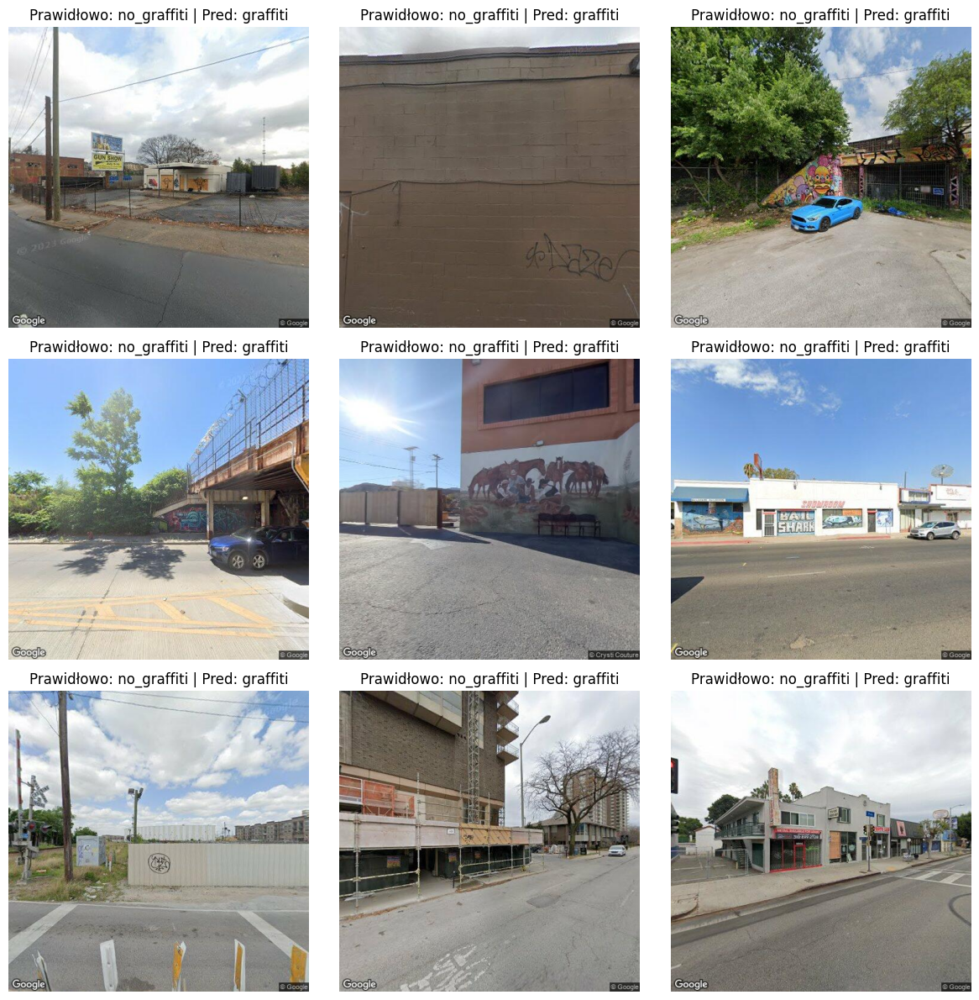

In [ ]:
show_misclassified_images(model_effnet, test_generator, ['no_graffiti', 'graffiti'])

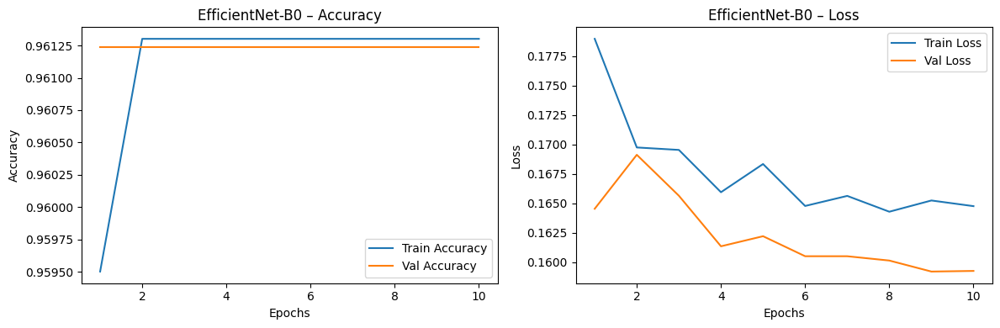

In [ ]:
plot_learning_curves(history_effnet, "EfficientNet-B0")

**Dokładność (accuracy)**

Wykres dokładności pokazuje, że model EfficientNet-B0 bardzo szybko osiąga wysoką skuteczność klasyfikacji, zarówno na danych treningowych, jak i walidacyjnych. Już po drugiej epoce dokładność stabilizuje się na poziomie około 96,13% i pozostaje na tym samym poziomie do końca treningu. Taki przebieg sugeruje, że model skutecznie nauczył się rozpoznawać wzorce w danych już na bardzo wczesnym etapie procesu uczenia. Co istotne, linie dokładności dla zbioru treningowego i walidacyjnego niemal się pokrywają, co świadczy o dobrej generalizacji modelu i braku oznak przeuczenia. Model zachowuje się stabilnie, a jego skuteczność nie pogarsza się w kolejnych epokach, co jest pozytywnym sygnałem świadczącym o poprawnym przebiegu treningu.

**Strata (loss)**

Analiza wykresu straty pokazuje systematyczny spadek wartości funkcji kosztu zarówno dla danych treningowych, jak i walidacyjnych. W pierwszych kilku epokach obserwujemy stosunkowo szybki spadek straty, co oznacza, że model efektywnie minimalizuje błędy predykcji. Warto zwrócić uwagę na fakt, że od około trzeciej epoki strata walidacyjna jest niższa niż strata treningowa, co może wydawać się nietypowe. Taka sytuacja może wynikać z użycia technik regularizacji, takich jak dropout czy augmentacja danych, lub z prostszej struktury danych walidacyjnych. Różnica ta nie sugeruje jednak przeuczenia, ponieważ wartości strat dla obu zbiorów zmniejszają się w sposób płynny i stabilny. Brak nagłych wzrostów straty walidacyjnej potwierdza, że model utrzymuje zdolność do uogólniania wiedzy, a cały proces treningu przebiega poprawnie.

97/97 ━━━━━━━━━━━━━━━━━━━━ 235s 2s/step
📄 [Model: EfficientNet-B0] – Classification Report:
              precision    recall  f1-score   support

    graffiti       1.00      0.09      0.17       120
 no_graffiti       0.96      1.00      0.98      2976

    accuracy                           0.96      3096
   macro avg       0.98      0.55      0.57      3096
weighted avg       0.97      0.96      0.95      3096

F1-score: 0.9820


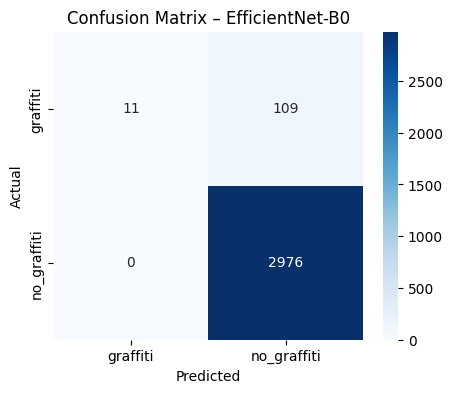

AUC: 0.8217


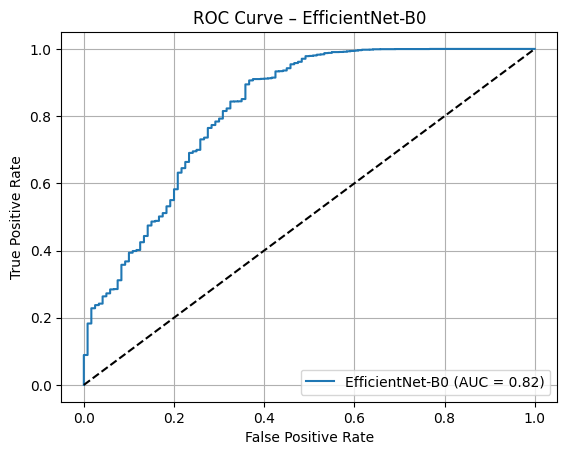

In [ ]:
evaluate_model(model_effnet_tune, "EfficientNet-B0")

# Interpretacja wyników (po fine-tuningu)

* **Accuracy: 0.96**
Model poprawnie sklasyfikował 96% przykładów – taki sam wynik jak przed fine-tuningiem. Ale jak wcześniej, to myląca metryka ze względu na dominację klasy no_graffiti.

* **F1-score: 0.9820**
Mimo bardzo wysokiego ogólnego F1-score, wynik ten jest silnie zawyżony przez dużą liczbę przypadków klasy „no_graffiti”.

**2. Wyniki dla poszczególnych klas**

**Klasa: graffiti**

* **Precision: 1.00**
Model ani razu się nie pomylił, jeśli już coś sklasyfikował jako graffiti. To oznacza, że nie ma żadnych fałszywych pozytywów. Jednak jest to mylący wynik, ponieważ predykcji dla tej klasy było skrajnie mało.

* **Recall: 0.09**
Model wykrył tylko 9% rzeczywistych przypadków graffiti – czyli przeoczył 91% graffiti. To nieco lepiej niż 0.00 w poprzedniej wersji, ale wciąż bardzo źle.

* **F1-score: 0.17**
To bardzo niski wynik – model wciąż praktycznie nie radzi sobie z klasą graffiti, choć unika fałszywych pozytywów.

**Klasa: no_graffiti**

* **Precision: 0.96**
Model czasami myli obraz z graffiti z obrazem bez graffiti, ale generalnie jest precyzyjny w rozpoznawaniu klasy „no_graffiti”.

* **Recall: 1.00**
Model nie przeoczył żadnego obrazu bez graffiti – wszystko zaklasyfikował poprawnie jako no_graffiti.

* **F1-score: 0.98**
Model osiąga niemal idealną skuteczność dla klasy dominującej.

**3. Średnie wartości**
* **Macro avg – Precision: 0.98**
Średnia precyzja między klasami jest wysoka, głównie dzięki idealnemu wynikowi dla klasy graffiti.

* **Macro avg – Recall: 0.55**
Model rozpoznaje jedną klasę prawie perfekcyjnie, ale ignoruje drugą – daje to średnią czułość na poziomie zaledwie 55%.

* **Macro avg – F1-score: 0.57** Niska wartość F1-score potwierdza jednostronność modelu. Model nie radzi sobie z zadaniem, które wymaga skutecznego działania na obu klasach.

* **Weighted avg – Precision: 0.97**
Wysoka wartość spowodowana dominacją klasy „no_graffiti” w zbiorze danych. Pomimo ogólnie dobrej precyzji, jest to wynik nierównomierny.

* **Weighted avg – Recall: 0.96**
Model dobrze radzi sobie z dominującą klasą, co sztucznie zawyża tę wartość – skuteczność względem klasy graffiti jest pomijana.

* **Weighted avg – F1-score: 0.95**
Wysoka wartość ukrywa realne wady modelu – ignorowanie jednej z klas powoduje, że wynik ten jest mylący i nieoddający rzeczywistej użyteczności modelu.

**4. Confusion Matrix:**
* True Positives (TP) - model poprawnie zaklasyfikował jedynie 11 przypadków jako „graffiti”, co oznacza, że tylko tyle obrazów zawierających rzeczywiste graffiti zostało trafnie rozpoznanych. Tak niski wynik świadczy o bardzo zachowawczej strategii predykcyjnej modelu – unika on przypisywania etykiety „graffiti”, co przekłada się na wysoką precyzję, ale jednocześnie drastycznie ogranicza jego użyteczność w detekcji tej klasy.

* False Negatives (FN) - model przeoczył aż 109 przypadków graffiti, uznając je błędnie za no_graffiti. To aż 91% wszystkich rzeczywistych przypadków graffiti, co pokazuje, że model ma poważny problem z czułością (recall) dla tej klasy. W praktyce oznacza to, że większość graffiti pozostaje niewykryta.

* False Positives (FP) - model nie popełnił ani jednego błędu typu false positive – żaden obraz bez graffiti nie został błędnie sklasyfikowany jako graffiti. To skutkuje idealną precyzją (precision = 1.00), ale niestety kosztem bardzo niskiej wykrywalności.

* True Negatives (TN) - wszystkie obrazy nieposiadające graffiti zostały poprawnie sklasyfikowane jako no_graffiti. Pokazuje to, że model bardzo dobrze rozpoznaje klasę dominującą i jest niemal bezbłędny w klasyfikacji negatywnej.

**5. Krzywa ROC i AUC**

**Krzywa ROC** wznosi się stopniowo i znajduje się wyraźnie powyżej linii klasyfikatora losowego. Choć nie osiąga idealnej bliskości lewego górnego rogu wykresu, wskazuje to na istotną zdolność modelu do rozróżniania klas lepszą niż losowa.

**AUC (Area Under Curve): 0.82**
Pole pod krzywą wynosi 0.82, co świadczy o dobrej skuteczności klasyfikatora, choć nie jest to model o perfekcyjnej precyzji.

97/97 ━━━━━━━━━━━━━━━━━━━━ 19s 177ms/step
Liczba błędnie sklasyfikowanych obrazów: 105


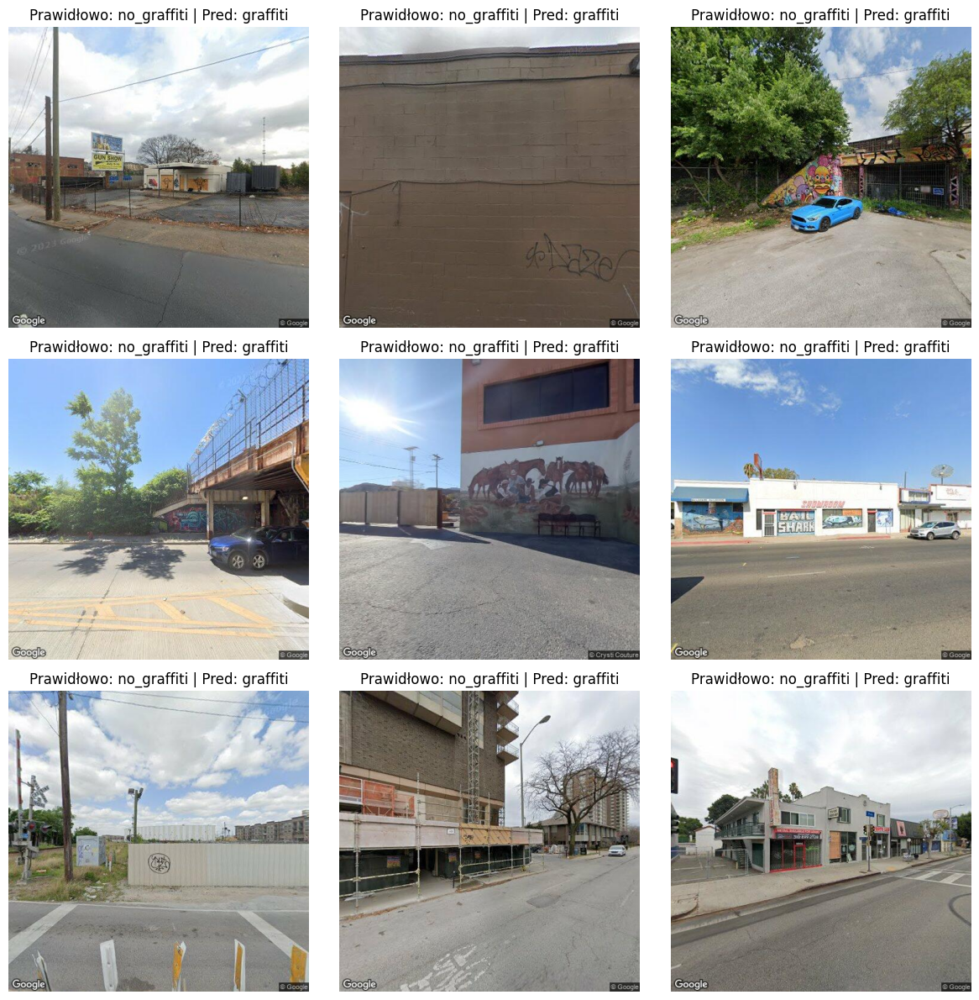

In [ ]:
show_misclassified_images(model_effnet_tune, test_generator, ['no_graffiti', 'graffiti'])

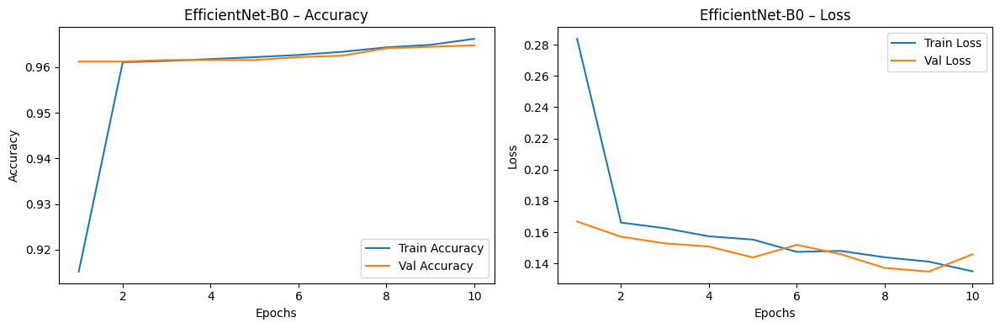

In [ ]:
plot_learning_curves(history_effnet_tune, "EfficientNet-B0")

**Dokładność (Accuracy)**

Na wykresie dokładności widać, że model rozpoczyna trening z niższą dokładnością, wynoszącą około 91,5% w pierwszej epoce, ale bardzo szybko poprawia swoje wyniki. Już w drugiej epoce osiąga dokładność powyżej 96% na danych treningowych i utrzymuje bardzo stabilny, stopniowo rosnący trend do końca dziesiątej epoki. Co ciekawe, dokładność walidacyjna już od początku jest wysoka i na przestrzeni kolejnych epok niemal niezmiennie utrzymuje się na poziomie około 96%, z delikatną tendencją wzrostową pod koniec treningu. Przez większość epok dokładność walidacyjna przewyższa dokładność treningową, co może świadczyć o dobrym dopasowaniu modelu do danych oraz o zastosowaniu skutecznych technik regularizacji. Brak istotnych wahań i stabilny przebieg obu krzywych wskazują, że model uczy się w sposób zrównoważony i nie przejawia oznak przeuczenia.

**Strata (Loss)**

Wykres funkcji kosztu potwierdza wnioski płynące z analizy accuracy. Już po pierwszej epoce obserwujemy gwałtowny spadek straty treningowej, który świadczy o szybkim przyswajaniu wzorców przez model. W kolejnych epokach spadek ten jest mniej dynamiczny, ale wciąż zauważalny. Wartość straty dla zbioru walidacyjnego utrzymuje się na bardzo zbliżonym poziomie do straty treningowej, a przez część treningu jest nawet nieco niższa. Oznacza to, że model nie tylko dobrze uczy się danych treningowych, ale również skutecznie generalizuje tę wiedzę na dane nieznane. Krzywe strat nie rozchodzą się znacząco, nie ma też żadnych nagłych wzrostów straty walidacyjnej, co sugeruje brak problemów z nadmiernym dopasowaniem.

# Porównanie modeli

In [ ]:
data = {
    "CNN": {
        "Accuracy": 0.99, "Precision (grafiti)": 0.91, "Recall (grafiti)": 0.74,
        "Precision (no_grafiti)": 0.99, "Recall (no_grafiti)": 1.00,
        "F1-score": 0.99, "AUC": 0.95
    },
    "MobileNetV2": {
        "Accuracy": 0.99, "Precision (grafiti)": 0.97, "Recall (grafiti)": 0.73,
        "Precision (no_grafiti)": 0.99, "Recall (no_grafiti)": 1.00,
        "F1-score": 0.99, "AUC": 0.98
    },
    "MobileNetV2 Fine-Tuned": {
        "Accuracy": 0.99, "Precision (grafiti)": 0.98, "Recall (grafiti)": 0.83,
        "Precision (no_grafiti)": 0.99, "Recall (no_grafiti)": 0.92,
        "F1-score": 0.99, "AUC": 0.99
    },
    "ResNet50": {
        "Accuracy": 0.97, "Precision (grafiti)": 1.00, "Recall (grafiti)": 0.27,
        "Precision (no_grafiti)": 0.97, "Recall (no_grafiti)": 1.00,
        "F1-score": 0.98, "AUC": 0.81
    },
    "ResNet50 Fine-Tuned": {
        "Accuracy": 0.99, "Precision (grafiti)": 0.98, "Recall (grafiti)": 0.68,
        "Precision (no_grafiti)": 0.99, "Recall (no_grafiti)": 1.00,
        "F1-score": 0.99, "AUC": 0.96
    },
    "EfficientNetB0": {
        "Accuracy": 0.96, "Precision (grafiti)": 0.00, "Recall (grafiti)": 0.00,
        "Precision (no_grafiti)": 0.96, "Recall (no_grafiti)": 1.00,
        "F1-score": 0.98, "AUC": 0.81
    },
    "EfficientNetB0 Fine-Tuned": {
        "Accuracy": 0.96, "Precision (grafiti)": 1.00, "Recall (grafiti)": 0.09,
        "Precision (no_grafiti)": 0.96, "Recall (no_grafiti)": 1.00,
        "F1-score": 0.98, "AUC": 0.82
    }
}

# Tworzenie tabeli
df = pd.DataFrame.from_dict(data, orient='index').round(2)

# HTML z poziomym przewijaniem
style = """
<div style="overflow-x: auto; width: 100%;">
  {table}
</div>
"""

# Wyświetlenie tabeli w Jupyterze z przewijaniem
display(HTML(style.format(table=df.to_html(classes="table table-striped", border=0))))

,Accuracy,Precision (grafiti),Recall (grafiti),Precision (no_grafiti),Recall (no_grafiti),F1-score,AUC
CNN,0.99,0.91,0.74,0.99,1.00,0.99,0.95
MobileNetV2,0.99,0.97,0.73,0.99,1.00,0.99,0.98
MobileNetV2 Fine-Tuned,0.99,0.98,0.83,0.99,0.92,0.99,0.99
ResNet50,0.97,1.00,0.27,0.97,1.00,0.98,0.81
ResNet50 Fine-Tuned,0.99,0.98,0.68,0.99,1.00,0.99,0.96
EfficientNetB0,0.96,0.00,0.00,0.96,1.00,0.98,0.81
EfficientNetB0 Fine-Tuned,0.96,1.00,0.09,0.96,1.00,0.98,0.82


## Wnioski:
* Najlepszym modelem ogólnie jest MobileNetV2 po fine-tuningu, który osiągnął najwyższy AUC (0.99) oraz bardzo dobrą równowagę między precyzją a czułością dla klasy „graffiti” (98% / 83%). Jest to model najlepiej identyfikujący graffiti bez nadmiernych błędów fałszywie pozytywnych.

* Custom CNN radził sobie zaskakująco dobrze mimo braku transfer learningu. Osiągnął podobny poziom dokładności (99%) co najlepsze modele, ale jego recall dla graffiti (74%) pozostaje niższy niż u tunowanych modeli.

* ResNet50 w wersji bazowej praktycznie nie wykrywał graffiti (recall 0.27), co czyniłoby go nieprzydatnym w zastosowaniach praktycznych. Jednak fine-tuning znacznie poprawił jego skuteczność, zwiększając recall do 68% przy zachowaniu wysokiej precyzji (98%).

* Modele EfficientNetB0, zarówno bazowy, jak i po fine-tuningu, zawiodły w wykrywaniu graffiti – ich recall dla tej klasy nie przekroczył 9%, mimo że osiągały wysoką skuteczność dla klasy „no_graffiti”. To oznacza, że te modele są nieprzydatne w obecnej formie do zadania detekcji graffiti.

* Wszystkie modele, niezależnie od architektury, bardzo dobrze radziły sobie z klasyfikacją zdjęć bez graffiti, z Recall często osiągającym 100%.



